<a href="https://colab.research.google.com/github/elykka/VCS_project/blob/master/Colab_CM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **TO DO BEFORE RUNNING THE NOTEBOOK**
There are some global varaibles that must be set to ensure a smooth execution, they can be set in the cell below

These variables are:

*   **data_source**: 'google drive' or 'link' describing how the dataset is to be loaded.
*   **path_train**: path to the zip containing the training images
*   **path_val**: path to the zip containing the validation images
*   **path_test**: path to the zip containing the test images
*   **path_annotations**: path to the zip containing the annotations for training and validation sets.
* **train_name** = name of the folder containing the training images (inside zip)
* **val_name** = name of the folder containing the validation images (inside zip)
* **test_name** = name of the folder containing the test images (inside zip)
* **train_json** = name of the json file containing the annotations for training images (inside zip)
* **val_json** = name of the json file containing the annotations for training images (inside zip)
* **img_example** = path of an image that we want to visualize
* **file_yaml** = path to the file yaml containing the model that is to be used
*  **weights** = path to the file pth containing the weights that are to be used (must refer to the same model otherwise they will not be loaded correctly)

!!!NOTE: DRIVE REQUIRES USER INTERACTION. 

The selection of the drive that is to be used and a passkey (given after the selection of the drive).
The whole content of the drive will be mounted.

Make sure that colab has enough space to store the sets.

In [1]:
data_source = 'link'

# COCO2017FILTERED

# data_type = 'coco'
# path_train = 'https://www.dropbox.com/s/jx6d859rm9nd9na/train2017_person.zip?dl=0'
# path_val = 'https://www.dropbox.com/s/4qmt05me706qw7m/val2017_person.zip?dl=0'
# path_test = 'https://www.dropbox.com/s/zw5imwn4vokbuh9/test2017_filtered.zip?dl=0'
# path_annotations = 'https://www.dropbox.com/s/h0d8bw0hxpnkjzf/person_annotations.zip?dl=0'
# ann_folder = 'person_annotations/'
# train_name = 'train2017_person'
# val_name = 'val2017_person'
# test_name = 'test2017_filtered'
# train_json = 'train2017_person.json'
# val_json = 'val2017_person.json'
# img_example = '/content/centermask2/datasets/coco/val2017_filtered/000000000139.jpg'

# MOTS20

# data_type = 'mots'
# path_train = 'https://www.dropbox.com/s/dsmic3bzw9mivxz/MOTS_train.zip?dl=0'
# path_val = 'https://www.dropbox.com/s/luyz1968w86jz8w/MOTS_val.zip?dl=0'
# path_test = 'https://www.dropbox.com/s/flfr5stq1c8fbfn/MOTS_test.zip?dl=0'
# path_annotations = 'https://www.dropbox.com/s/xskfyyfyjmb7i6i/MOTS_annotations.zip?dl=0'
# ann_folder = 'MOTS_annotations/'
# train_name = 'MOTS_train'
# val_name = 'MOTS_val'
# test_name = 'MOTS_test/MOTS20-01'
# train_json = 'MOTS_train.json'
# val_json = 'MOTS_val.json'
# img_example = '/content/centermask2/datasets/coco/MOTS_val/11000001.jpg'

# MOT16

data_type = 'mot'
path_train = 'https://www.dropbox.com/s/tlycs0ytxtnrd2b/MOT_train.zip?dl=0'
path_val = 'https://www.dropbox.com/s/t07ezhw8qfmcfgt/MOT_val.zip?dl=0'
path_test = 'https://www.dropbox.com/s/twnczp9j8nrpw4w/MOT_test.zip?dl=0'
path_annotations = 'https://www.dropbox.com/s/m03hkh6whpx7h3h/MOT_annotations.zip?dl=0'
ann_folder = 'MOT_annotations/'
train_name = 'MOT_train'
val_name = 'MOT_val'
test_name = 'MOT_test/MOT16-01'
train_json = 'MOT_train.json'
val_json = 'MOT_val.json'
img_example = '/content/centermask2/datasets/coco/MOT_val/09000045.jpg'


file_yaml = '/content/centermask2/configs/centermask/centermask_lite_V_39_eSE_FPN_ms_4x.yaml'
weights = 'https://www.dropbox.com/s/353lctjaei6gw9q/centermask2-lite-V-39-eSE-FPN-ms-4x.pth?dl=0'
save_feature_maps = False


# **INSTALL CENTERMASK2 DEPENDENCIES**
The following blocks will:

*   install and import the dependencies for centermask2 and detectron2
*   install detectron2
*   clone centermask2 github repository for the project

In [2]:
%%script false --no-raise-error
# check the packages available
!pip freeze

In [3]:
# DEPENDENCIES

!pip install pyyaml==5.1 pycocotools>=2.0.1 imgaug==0.2.6
# !pip install torch==1.4.0 torchvision==0.5.0
import torch, torchvision, cv2
# pytorch >= 1.4 and matching torchvision, 
print(torch.__version__, torch.cuda.is_available())
# gcc, g++ >=5
!gcc --version
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-n4ncxalx
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-n4ncxalx
     |████████████████████████████████| 2.2MB 2.7MB/s 
  Created wheel for detectron2: filename=detectron2-0.2.1-cp36-cp36m-linux_x86_64.whl size=5166161 sha256=61342cbd3004b6c4509e0d6e2005d5de63a510571a7ebe2eee78bb2872f2e883
  Stored in directory: /tmp/pip-ephem-wheel-cache-9t8eywx2/wheels/33/ac/bb/5ef90585c21c67e2f0b6aae55ec6b43017ad57af33d5f4c339
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200716-cp36-none-any.whl size=42325 sha256=bcf1ab65ac2314eac78d1f1fb80c6a641b4be94dee1156e2fd04bc04c696b761
  Stored in directory: 

In [4]:
!git clone https://github.com/youngwanLEE/centermask2.git

Cloning into 'centermask2'...
remote: Enumerating objects: 174, done.
remote: Counting objects: 100% (174/174), done.
remote: Compressing objects: 100% (111/111), done.
remote: Total 174 (delta 79), reused 140 (delta 56), pack-reused 0
Receiving objects: 100% (174/174), 88.45 KiB | 494.00 KiB/s, done.
Resolving deltas: 100% (79/79), done.


# **DOWNLOAD, EXTRACT DATASETS AND GET MODELS FILES**

From drive or downloading directly from the site. 

Dowloading from a link requires that colab has enough space to store and extract the zip files.

We have chosen to adopt centermask and detectron standard paths for annotations files and train, validation, test sets.

```
centermask2/
    datasets/
        annotations/
            instances_training_images_folder_name
            instances_validation_images_folder_name
        training_images_folder_name/
        validation_images_folder_name/
```



In [5]:
instances_train = '/content/centermask2/datasets/coco/'+ ann_folder + train_json
instances_val = '/content/centermask2/datasets/coco/' + ann_folder + val_json

train_folder = '/content/centermask2/datasets/coco/' + train_name +'/'
val_folder = '/content/centermask2/datasets/coco/'+ val_name +'/'
test_folder = '/content/centermask2/datasets/coco/' + test_name +'/'

In [6]:
### DOWNLOADING FROM DRIVE ###
if data_source == 'google drive':
  # The datsets that are to be used during the training/ testing need to be in a google drive
  # It will ask to open a web page to choose the drive account, allow sharing to colab and a code that is to be inserted here, under the link.
  # THE WHOLE CONTENT OF THE DRIVE WILL BE MOUNTED. 

  import zipfile
  from shutil import copyfile


  # # Add Google Drive
  # from google.colab import drive
  # drive.mount('/content/drive/')

  copyfile(weights, '/weights.pth')
  copyfile('/content/drive/My Drive/' + path_train , '/train')
  copyfile('/content/drive/My Drive/' + path_val , '/val')
  copyfile('/content/drive/My Drive/' + path_annotations , '/annotations')



  train_zip = zipfile.ZipFile('/content/drive/My Drive/' + path_train)
  val_zip = zipfile.ZipFile('/content/drive/My Drive/' + path_val)
  test_zip = zipfile.ZipFile('/content/drive/My Drive/' + path_test)
  annotations_zip = zipfile.ZipFile('/content/drive/My Drive/' + path_annotations)

  train_zip = zipfile.ZipFile('/train')
  val_zip = zipfile.ZipFile('/val')
  test_zip = zipfile.ZipFile('/content/drive/My Drive/' + path_test)
  annotations_zip = zipfile.ZipFile('/annotations')


  # Files extraction
  train_zip.extractall('/content/centermask2/datasets/coco/')
  val_zip.extractall('/content/centermask2/datasets/coco/')
  test_zip.extractall('/content/centermask2/datasets/coco/')
  annotations_zip.extractall('/content/centermask2/datasets/coco/')

  # Remove Google Drive
  drive.flush_and_unmount()

In [7]:
### DOWNLOADING FROM SOURCE ###

if data_source == 'link':
  
  import os
  from shutil import rmtree

  os.mkdir('/zips')

  !wget -O /zips/train_zip.zip $path_train
  !wget -O /zips/val_zip.zip $path_val
  !wget -O /zips/test_zip.zip $path_test
  !wget -O /zips/annotations_zip.zip $path_annotations
  !wget -O /weights.pth $weights

  # Files extraction
  !unzip /zips/train_zip.zip -d /content/centermask2/datasets/coco/
  !unzip /zips/val_zip.zip -d /content/centermask2/datasets/coco/
  !unzip /zips/test_zip.zip -d /content/centermask2/datasets/coco/
  !unzip /zips/annotations_zip.zip -d /content/centermask2/datasets/coco/

  # Delete zips to free memory
  rmtree('/zips/')

Output streaming troncato alle ultime 5000 righe.
  inflating: /content/centermask2/datasets/coco/MOT_test/MOT16-03/000694.jpg  
  inflating: /content/centermask2/datasets/coco/MOT_test/MOT16-03/000695.jpg  
  inflating: /content/centermask2/datasets/coco/MOT_test/MOT16-03/000696.jpg  
  inflating: /content/centermask2/datasets/coco/MOT_test/MOT16-03/000700.jpg  
  inflating: /content/centermask2/datasets/coco/MOT_test/MOT16-03/000701.jpg  
  inflating: /content/centermask2/datasets/coco/MOT_test/MOT16-03/000702.jpg  
  inflating: /content/centermask2/datasets/coco/MOT_test/MOT16-03/000703.jpg  
  inflating: /content/centermask2/datasets/coco/MOT_test/MOT16-03/000707.jpg  
  inflating: /content/centermask2/datasets/coco/MOT_test/MOT16-03/000708.jpg  
  inflating: /content/centermask2/datasets/coco/MOT_test/MOT16-03/000709.jpg  
  inflating: /content/centermask2/datasets/coco/MOT_test/MOT16-03/000710.jpg  
  inflating: /content/centermask2/datasets/coco/MOT_test/MOT16-03/000711.jpg  
  

# **VISUALIZE THE DATASET**

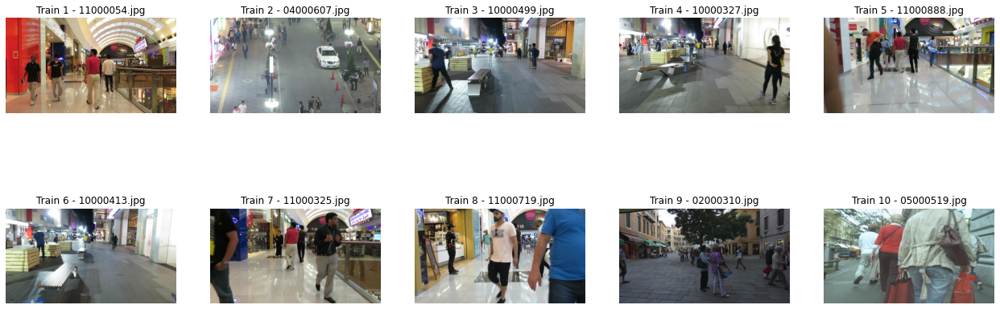

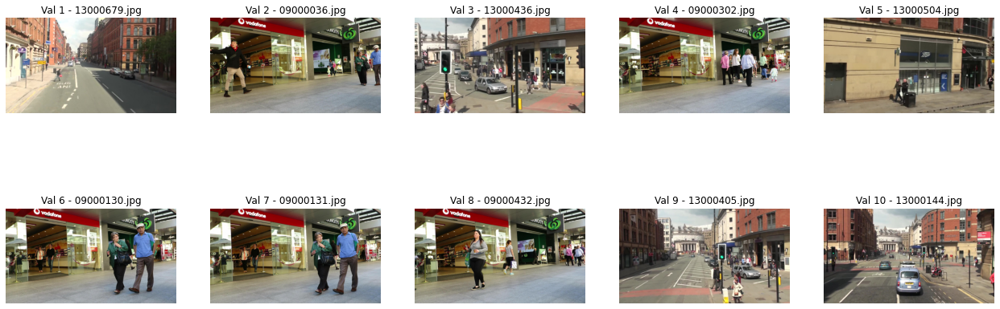

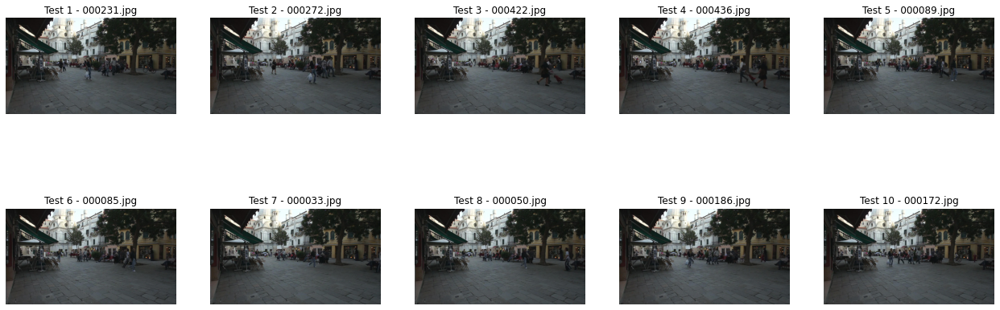

In [8]:
# VISUALIZE THE FIRST 10 IMAGES

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

train_img = os.listdir(train_folder)
val_img = os.listdir(val_folder)
test_img = os.listdir(test_folder)

# Read the first 10 images and plot them

plt.figure(figsize=(22, 8))
for i in range(10):
	img = mpimg.imread(os.path.join(train_folder, train_img[i])) 
	plt.subplot(2, 5,i+1), plt.imshow(img), plt.title('Train ' + str(i+1) + ' - ' +  train_img[i]), plt.axis('off')
 
plt.figure(figsize=(22,8))
for i in range(10):
	img = mpimg.imread(os.path.join(val_folder, val_img[i])) 
	plt.subplot(2, 5,i+1), plt.imshow(img), plt.title('Val '+ str(i+1) + ' - ' + val_img[i]), plt.axis('off')
 
plt.figure(figsize=(22,8))
for i in range(10):
	img = mpimg.imread(os.path.join(test_folder, test_img[i])) 
	plt.subplot(2, 5,i+1), plt.imshow(img), plt.title('Test ' + str(i+1)+ ' - ' + test_img[i]), plt.axis('off')
 


#**CUSTOM VISUALIZER**

In [9]:
%%writefile /content/centermask2/demo/visualizer.py
from detectron2.utils.visualizer import ColorMode, Visualizer, VisImage, _create_text_labels
import numpy as np
import torch
from detectron2.structures import Boxes, BoxMode


class CustomVisualizer(Visualizer):
  def __init__(self, img_rgb, metadata=None, scale=1.0, instance_mode=ColorMode.IMAGE):
        """
        Args:
            img_rgb: a numpy array of shape (H, W, C), where H and W correspond to
                the height and width of the image respectively. C is the number of
                color channels. The image is required to be in RGB format since that
                is a requirement of the Matplotlib library. The image is also expected
                to be in the range [0, 255].
            metadata (MetadataCatalog): image metadata.
            instance_mode (ColorMode): defines one of the pre-defined style for drawing
                instances on an image.
        """
        Visualizer.__init__(self, img_rgb, metadata, scale, instance_mode)
        self.img = np.asarray(img_rgb).clip(0, 255).astype(np.uint8)
        if metadata is None:
            metadata = MetadataCatalog.get("__nonexist__")
        self.metadata = metadata
        self.output = VisImage(self.img, scale=scale)
        self.cpu_device = torch.device("cpu")

        # too small texts are useless, therefore clamp to 9
        self._default_font_size = max(
            np.sqrt(self.output.height * self.output.width) // 90, 10 // scale
        )
        self._instance_mode = instance_mode

  def draw_instance_predictions(self, predictions):
        """
        Draw instance-level prediction results on an image.

        Args:
            predictions (Instances): the output of an instance detection/segmentation
                model. Following fields will be used to draw:
                "pred_boxes", "pred_classes", "scores", "pred_masks" (or "pred_masks_rle").

        Returns:
            output (VisImage): image object with visualizations.
        """
        boxes = predictions.pred_boxes if predictions.has("pred_boxes") else None
        scores = predictions.scores if predictions.has("scores") else None
        classes = predictions.pred_classes if predictions.has("pred_classes") else None
        labels = _create_text_labels(classes, scores, self.metadata.get("thing_classes", None))
        keypoints = predictions.pred_keypoints if predictions.has("pred_keypoints") else None
        centers = predictions.locations if predictions.has("locations") else None

        if predictions.has("pred_masks"):
            masks = np.asarray(predictions.pred_masks)
            masks = [GenericMask(x, self.output.height, self.output.width) for x in masks]
        else:
            masks = None

        if self._instance_mode == ColorMode.SEGMENTATION and self.metadata.get("thing_colors"):
            colors = [
                self._jitter([x / 255 for x in self.metadata.thing_colors[c]]) for c in classes
            ]
            alpha = 0.8
        else:
            colors = None
            alpha = 0.5

        if self._instance_mode == ColorMode.IMAGE_BW:
            self.output.img = self._create_grayscale_image(
                (predictions.pred_masks.any(dim=0) > 0).numpy()
            )
            alpha = 0.3

        self.overlay_instances(
            masks=masks,
            boxes=boxes,
            labels=labels,
            keypoints=keypoints,
            assigned_colors=colors,
            alpha=alpha,
        )
        # draw centers
        if centers is not None:
          for coord in centers:
            self.draw_circle(coord, color='deepskyblue', radius=2)

        # TODO: draw label reid
        return self.output

  def draw_dataset_dict(self, dic):
        """
        Draw annotations/segmentaions in Detectron2 Dataset format.

        Args:
            dic (dict): annotation/segmentation data of one image, in Detectron2 Dataset format.

        Returns:
            output (VisImage): image object with visualizations.
        """
        annos = dic.get("annotations", None)
        if annos:
            if "segmentation" in annos[0]:
                masks = [x["segmentation"] for x in annos]
            else:
                masks = None
            if "keypoints" in annos[0]:
                keypts = [x["keypoints"] for x in annos]
                keypts = np.array(keypts).reshape(len(annos), -1, 3)
            else:
                keypts = None

            boxes = [BoxMode.convert(x["bbox"], x["bbox_mode"], BoxMode.XYXY_ABS) for x in annos]

            labels = [x["category_id"] for x in annos]
            colors = None
            if self._instance_mode == ColorMode.SEGMENTATION and self.metadata.get("thing_colors"):
                colors = [
                    self._jitter([x / 255 for x in self.metadata.thing_colors[c]]) for c in labels
                ]
            names = self.metadata.get("thing_classes", None)
            if names:
                labels = [names[i] for i in labels]
            labels = [
                "{}".format(i) + ("|crowd" if a.get("iscrowd", 0) else "")
                for i, a in zip(labels, annos)
            ]

            if "track_id" in annos[0]:
                tracks = [x["track_id"] for x in annos] 
            else:
                tracks = None

            self.overlay_instances(
                labels=labels, boxes=boxes, masks=masks, keypoints=keypts, assigned_colors=colors
            )
            if tracks is not None:
                if boxes is not None:
                  boxes = self._convert_boxes(boxes)
                  num_instances = len(boxes)
                  for i in range(num_instances):
                    x0, y0, x1, y1 = boxes[i]
                    text_pos = (x0, y1)  # if drawing boxes, put text on the box corner.
                    font_size = (np.clip(((y1 - y0) / np.sqrt(self.output.height * self.output.width) - 0.02) / 0.08 + 1, 1.2, 2)* 0.5 * self._default_font_size)
                    self.draw_text(tracks[i], text_pos, font_size=font_size, color="goldenrod", horizontal_alignment="left")
            
            # draw centers
            if boxes is not None:
                  boxes = self._convert_boxes(boxes)
                  num_instances = len(boxes)
                  for i in range(num_instances):
                    x0, y0, x1, y1 = boxes[i]
                    x_cent = (x1-x0)/2 + x0
                    y_cent = (y1-y0)/2 + y0
                    self.draw_circle([x_cent,y_cent], color='deepskyblue', radius=2)

        sem_seg = dic.get("sem_seg", None)
        if sem_seg is None and "sem_seg_file_name" in dic:
            with PathManager.open(dic["sem_seg_file_name"], "rb") as f:
                sem_seg = Image.open(f)
                sem_seg = np.asarray(sem_seg, dtype="uint8")
        if sem_seg is not None:
            self.draw_sem_seg(sem_seg, area_threshold=0, alpha=0.5)
        return self.output

Writing /content/centermask2/demo/visualizer.py


# **REGISTER DATASETS**

In [10]:
from detectron2.data.datasets import register_coco_instances, load_coco_json
from detectron2.data import MetadataCatalog, DatasetCatalog

# REGISTER COCO DATASET
if data_type == 'coco':
  register_coco_instances("my_dataset_train", {}, instances_train, train_folder)
  register_coco_instances("my_dataset_val", {}, instances_val, val_folder)

elif data_type == 'mot':
  def load_train():
    return load_coco_json(instances_train, train_folder, 'my_dataset_train', extra_annotation_keys=['track_id', 'visibility', 'confidence'])
  DatasetCatalog.register("my_dataset_train", load_train)
  def load_val():
    return load_coco_json(instances_val, val_folder, 'my_dataset_val', extra_annotation_keys=['track_id', 'visibility', 'confidence'])
  DatasetCatalog.register("my_dataset_val", load_val)

elif data_type == 'mots':
  def load_train():
    return load_coco_json(instances_train, train_folder, 'my_dataset_train', extra_annotation_keys=['track_id', 'area'])
  DatasetCatalog.register("my_dataset_train", load_train)
  def load_val():
    return load_coco_json(instances_val, val_folder, 'my_dataset_val', extra_annotation_keys=['track_id', 'area'])
  DatasetCatalog.register("my_dataset_val", load_val)

/content/centermask2/demo
{'file_name': '/content/centermask2/datasets/coco/MOT_train/02000001.jpg', 'height': 608, 'width': 1088, 'image_id': 2000001, 'annotations': [{'iscrowd': 0, 'bbox': [758.1999999999999, 235.31851851851854, 94.63333333333333, 213.36296296296297], 'category_id': 0, 'track_id': 0, 'visibility': 1.0, 'confidence': '1', 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [332.06666666666666, 251.64444444444447, 48.166666666666664, 148.05925925925928], 'category_id': 0, 'track_id': 1, 'visibility': 1.0, 'confidence': '1', 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [802.4, 242.63703703703706, 104.26666666666667, 189.15555555555557], 'category_id': 0, 'track_id': 2, 'visibility': 0.51351, 'confidence': '1', 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [598.4, 272.4740740740741, 20.4, 61.92592592592593], 'category_id': 0, 'track_id': 3, 'visibility': 0.94595, 'confidence': '1', 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, '

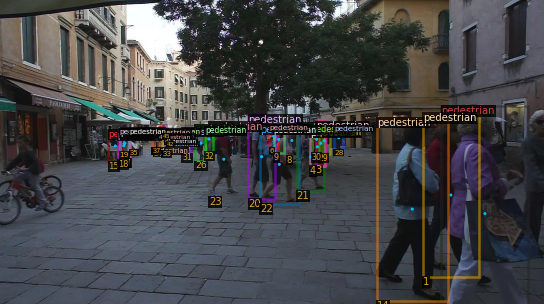

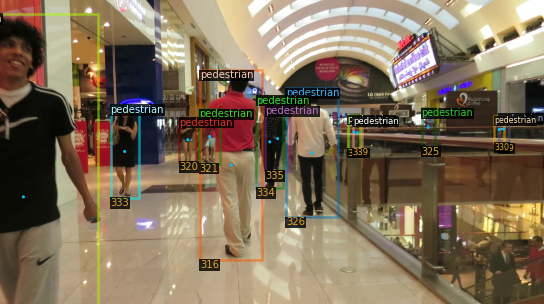

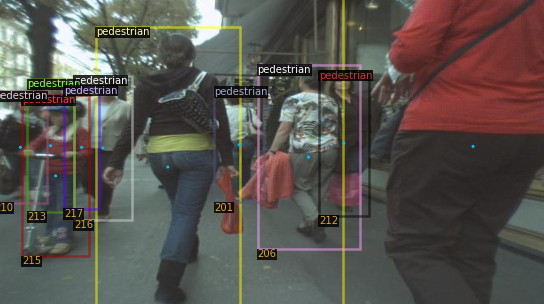

{'file_name': '/content/centermask2/datasets/coco/MOT_val/09000001.jpg', 'height': 608, 'width': 1088, 'image_id': 9000001, 'annotations': [{'iscrowd': 0, 'bbox': [147.33333333333334, 253.33333333333334, 57.8, 147.4962962962963], 'category_id': 0, 'track_id': 385, 'visibility': 1.0, 'confidence': '1', 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [955.4, 217.86666666666667, 96.89999999999999, 194.22222222222223], 'category_id': 0, 'track_id': 403, 'visibility': 1.0, 'confidence': '1', 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [1068.7333333333333, 184.0888888888889, 88.39999999999999, 227.43703703703704], 'category_id': 0, 'track_id': 404, 'visibility': 0.22293, 'confidence': '1', 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [710.0333333333333, 300.0592592592593, 35.699999999999996, 72.62222222222222], 'category_id': 0, 'track_id': 405, 'visibility': 1.0, 'confidence': '1', 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [732.13

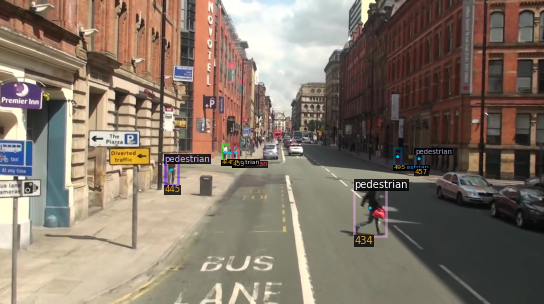

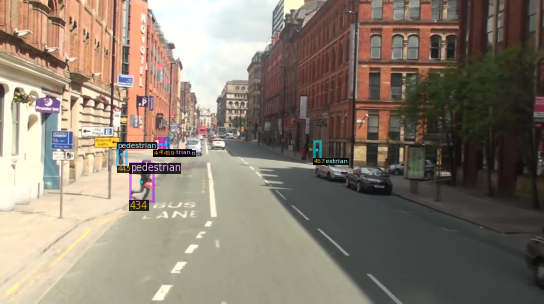

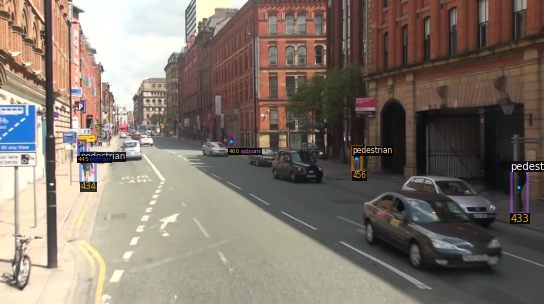

/content


In [11]:
# CHECK IF IT WAS REGISTERED CORRECTLY
%cd /content/centermask2/demo/
from visualizer import CustomVisualizer
from detectron2.data.datasets import load_coco_json
import random
import cv2
from google.colab.patches import cv2_imshow

dataset_dicts = DatasetCatalog.get("my_dataset_train")
print(dataset_dicts[0])
met = MetadataCatalog.get("my_dataset_train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = CustomVisualizer(img[:, :, ::-1], metadata=met, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

dataset_dicts = DatasetCatalog.get("my_dataset_val")
print(dataset_dicts[0])
met = MetadataCatalog.get("my_dataset_val")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = CustomVisualizer(img[:, :, ::-1], metadata=met, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

%cd /content/    

{'file_name': '/content/centermask2/datasets/coco/MOT_train/02000001.jpg', 'height': 608, 'width': 1088, 'image_id': 2000001, 'annotations': [{'iscrowd': 0, 'bbox': [758.1999999999999, 235.31851851851854, 94.63333333333333, 213.36296296296297], 'category_id': 0, 'track_id': 0, 'visibility': 1.0, 'confidence': '1', 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [332.06666666666666, 251.64444444444447, 48.166666666666664, 148.05925925925928], 'category_id': 0, 'track_id': 1, 'visibility': 1.0, 'confidence': '1', 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [802.4, 242.63703703703706, 104.26666666666667, 189.15555555555557], 'category_id': 0, 'track_id': 2, 'visibility': 0.51351, 'confidence': '1', 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [598.4, 272.4740740740741, 20.4, 61.92592592592593], 'category_id': 0, 'track_id': 3, 'visibility': 0.94595, 'confidence': '1', 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [618.2333333333333,

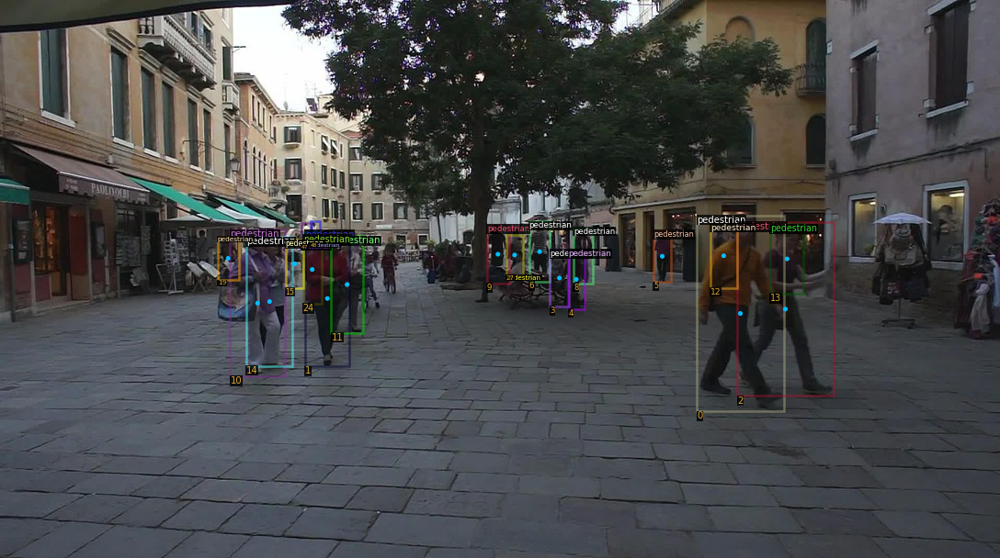

In [12]:
dataset_dicts = DatasetCatalog.get("my_dataset_train")
d= dataset_dicts[0]
print(d)
met = MetadataCatalog.get("my_dataset_train")

img = cv2.imread(os.path.join(train_folder, d['file_name']))
visualizer = CustomVisualizer(img[:, :, ::-1], metadata=met, scale=1.0)
out = visualizer.draw_dataset_dict(d)
cv2_imshow(out.get_image()[:, :, ::-1])

# **MODIFY PYTHON CODE FILES**

STEPS:

1.   open the file that needs to be edited with ***%pycat path/nome_file.py***
2.   copy the edited text into an empty cell and add ***%%writefile path/nome_file.py*** at the top of the cell
3.   modify code and execute the writefile cell to save the changes

!!!IMPORTANT: Leave the blocks otherwise the next runtime the repository will be cloned from scratch and all changes will be lost

# **MODIFY BACKBONE**

In [13]:
%%script false --no-raise-error
# MODIFY BACKBONE
# open file
%pycat /content/centermask2/centermask/modeling/backbone/vovnet.py

In [14]:
# edit and save
%%writefile /content/centermask2/centermask/modeling/backbone/vovnet.py

# Copyright (c) Youngwan Lee (ETRI) All Rights Reserved.
from collections import OrderedDict
import torch
import torch.nn as nn
import torch.nn.functional as F
import fvcore.nn.weight_init as weight_init
from detectron2.modeling.backbone import Backbone
from detectron2.modeling.backbone.build import BACKBONE_REGISTRY
from detectron2.modeling.backbone.fpn import FPN
from detectron2.layers import (
    Conv2d,
    DeformConv,
    ModulatedDeformConv,
    FrozenBatchNorm2d,
    ShapeSpec,
    get_norm,
)
from .fpn import LastLevelP6, LastLevelP6P7
#MOD3
from torchvision.utils import save_image

__all__ = [
    "VoVNet",
    "build_vovnet_backbone",
    "build_vovnet_fpn_backbone",
    "build_fcos_vovnet_fpn_backbone"
]

_NORM = False

VoVNet19_slim_dw_eSE = {
    'stem': [64, 64, 64],
    'stage_conv_ch': [64, 80, 96, 112],
    'stage_out_ch': [112, 256, 384, 512],
    "layer_per_block": 3,
    "block_per_stage": [1, 1, 1, 1],
    "eSE": True,
    "dw" : True
}

VoVNet19_dw_eSE = {
    'stem': [64, 64, 64],
    "stage_conv_ch": [128, 160, 192, 224],
    "stage_out_ch": [256, 512, 768, 1024],
    "layer_per_block": 3,
    "block_per_stage": [1, 1, 1, 1],
    "eSE": True,
    "dw" : True
}

VoVNet19_slim_eSE = {
    'stem': [64, 64, 128],
    'stage_conv_ch': [64, 80, 96, 112],
    'stage_out_ch': [112, 256, 384, 512],
    'layer_per_block': 3,
    'block_per_stage': [1, 1, 1, 1],
    'eSE' : True,
    "dw" : False
}

VoVNet19_eSE = {
    'stem': [64, 64, 128],
    "stage_conv_ch": [128, 160, 192, 224],
    "stage_out_ch": [256, 512, 768, 1024],
    "layer_per_block": 3,
    "block_per_stage": [1, 1, 1, 1],
    "eSE": True,
    "dw" : False
}

VoVNet39_eSE = {
    'stem': [64, 64, 128],
    "stage_conv_ch": [128, 160, 192, 224],
    "stage_out_ch": [256, 512, 768, 1024],
    "layer_per_block": 5,
    "block_per_stage": [1, 1, 2, 2],
    "eSE": True,
    "dw" : False
}

VoVNet57_eSE = {
    'stem': [64, 64, 128],
    "stage_conv_ch": [128, 160, 192, 224],
    "stage_out_ch": [256, 512, 768, 1024],
    "layer_per_block": 5,
    "block_per_stage": [1, 1, 4, 3],
    "eSE": True,
    "dw" : False
}

VoVNet99_eSE = {
    'stem': [64, 64, 128],
    "stage_conv_ch": [128, 160, 192, 224],
    "stage_out_ch": [256, 512, 768, 1024],
    "layer_per_block": 5,
    "block_per_stage": [1, 3, 9, 3],
    "eSE": True,
    "dw" : False
}

_STAGE_SPECS = {
    "V-19-slim-dw-eSE": VoVNet19_slim_dw_eSE,
    "V-19-dw-eSE": VoVNet19_dw_eSE,
    "V-19-slim-eSE": VoVNet19_slim_eSE,
    "V-19-eSE": VoVNet19_eSE,
    "V-39-eSE": VoVNet39_eSE,
    "V-57-eSE": VoVNet57_eSE,
    "V-99-eSE": VoVNet99_eSE,
}

def dw_conv3x3(in_channels, out_channels, module_name, postfix,
            stride=1, kernel_size=3, padding=1):
    """3x3 convolution with padding"""
    return [
        ('{}_{}/dw_conv3x3'.format(module_name, postfix),
            nn.Conv2d(in_channels, out_channels,
                      kernel_size=kernel_size,
                      stride=stride,
                      padding=padding,
                      groups=out_channels,
                      bias=False)),
        ('{}_{}/pw_conv1x1'.format(module_name, postfix),
            nn.Conv2d(in_channels, out_channels,
                      kernel_size=1,
                      stride=1,
                      padding=0,
                      groups=1,
                      bias=False)),
        ('{}_{}/pw_norm'.format(module_name, postfix), get_norm(_NORM, out_channels)),
        ('{}_{}/pw_relu'.format(module_name, postfix), nn.ReLU(inplace=True)),
    ]

class DFConv3x3(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        module_name,
        postfix,
        dilation=1,
        groups=1,
        with_modulated_dcn=None,
        deformable_groups=1
        ):
        super(DFConv3x3, self).__init__()
        self.module_names = []
        self.with_modulated_dcn = with_modulated_dcn
        if self.with_modulated_dcn:
            deform_conv_op = ModulatedDeformConv
            # offset channels are 2 or 3 (if with modulated) * kernel_size * kernel_size
            offset_channels = 27
        else:
            deform_conv_op = DeformConv
            offset_channels = 18

        unit_name = f"{module_name}_{postfix}/conv_offset"
        self.module_names.append(unit_name)
        self.add_module(unit_name, Conv2d(
            in_channels,
            offset_channels * deformable_groups,
            kernel_size=3,
            stride=1,
            padding=1 * dilation,
            dilation=dilation,
        ))
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.constant_(m.weight, 0)
                nn.init.constant_(m.bias, 0)

        unit_name = f"{module_name}_{postfix}/conv"
        self.module_names.append(unit_name)
        self.add_module(f"{module_name}_{postfix}/conv", deform_conv_op(
                    in_channels,
                    out_channels,
                    kernel_size=3,
                    stride=1,
                    padding=1 * dilation,
                    bias=False,
                    groups=groups,
                    dilation=1,
                    deformable_groups=deformable_groups,
                ))
        unit_name = f"{module_name}_{postfix}/norm"
        self.module_names.append(unit_name)
        self.add_module(unit_name, get_norm(_NORM, out_channels))


    def forward(self, x):
        if self.with_modulated_dcn:
            #offset conv
            offset_mask = getattr(self, self.module_names[0])(x)
            offset_x, offset_y, mask = torch.chunk(offset_mask, 3, dim=1)
            offset = torch.cat((offset_x, offset_y), dim=1)
            mask = mask.sigmoid()
            #conv
            out = getattr(self, self.module_names[1])(x, offset, mask)
        else:
            offset = getattr(self, self.module_names[0])(x)
            out = getattr(self, self.module_names[1])(x, offset)

        return F.relu_(getattr(self, self.module_names[2])(out))



def conv3x3(in_channels, out_channels, module_name, postfix, 
              stride=1, groups=1, kernel_size=3, padding=1):
    """3x3 convolution with padding"""
    return [
        (f'{module_name}_{postfix}/conv',
         nn.Conv2d(in_channels, 
                    out_channels, 
                    kernel_size=kernel_size, 
                    stride=stride, 
                    padding=padding, 
                    groups=groups, 
                    bias=False)),
        (f'{module_name}_{postfix}/norm', get_norm(_NORM, out_channels)),
        (f'{module_name}_{postfix}/relu', nn.ReLU(inplace=True))
    ]


def conv1x1(in_channels, out_channels, module_name, postfix, 
              stride=1, groups=1, kernel_size=1, padding=0):
    """1x1 convolution with padding"""
    return [
        (f'{module_name}_{postfix}/conv',
         nn.Conv2d(in_channels, 
                    out_channels, 
                    kernel_size=kernel_size, 
                    stride=stride, 
                    padding=padding, 
                    groups=groups,
                    bias=False)),
        (f'{module_name}_{postfix}/norm', get_norm(_NORM, out_channels)),
        (f'{module_name}_{postfix}/relu', nn.ReLU(inplace=True))
    ]

class Hsigmoid(nn.Module):
    def __init__(self, inplace=True):
        super(Hsigmoid, self).__init__()
        self.inplace = inplace

    def forward(self, x):
        return F.relu6(x + 3., inplace=self.inplace) / 6.

# #MOD5
# #Conv + norm + Prelu
# def conv_post_upsampling(in_channels, out_channels, module_name, postfix, 
#               stride=1, groups=1, kernel_size=1, padding=0, num_parameters = 1, init = 0.25):
#    return [
#            (f'{module_name}_{postfix}/conv',
#             nn.Conv2d(in_channels, 
#                     out_channels, 
#                     kernel_size=kernel_size, 
#                     stride=stride, 
#                     padding=padding, 
#                     groups=groups,
#                     bias=False)),
#            (f'{module_name}_{postfix}/norm', get_norm(_NORM, out_channels)),
#            (f'{module_name}_{postfix}/prelu', nn.PReLU(num_parameters, init))
#    ]

# class Upsampling(nn.Module):
#     def __init__(self, module, in_channels, out_channels, scale_factor = 2, inplace = True, dropout = 0.5):
#         super(Upsampling, self).__init__()
#         self.bilinear = nn.Upsample(scale_factor=scale_factor, mode='bilinear')
#         # self.conv = nn.Sequential(OrderedDict(conv_post_upsampling(in_channels, out_channels, module, '1', 
#         #       kernel_size=3, padding=1)))
#         # self.conv2 = nn.Sequential(
#         #         OrderedDict(conv_post_upsampling(in_channels, out_channels, module, '2', 
#         #       kernel_size=3, padding=1)))
#         self.dropout = nn.Dropout2d(p=dropout, inplace=inplace)

#     def forward(self, x):
#         # output = output.unsqueeze(0)
#         x = self.bilinear(x)
#         # x = self.conv(x)
#         # x = self.conv2(x) 
#         x = self.dropout(x)
#         return x
# #END MOD5


class eSEModule(nn.Module):
    def __init__(self, channel, reduction=4):
        super(eSEModule, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Conv2d(channel,channel, kernel_size=1,
                             padding=0)
        self.hsigmoid = Hsigmoid()

    def forward(self, x):
        input = x
        x = self.avg_pool(x)
        x = self.fc(x)
        x = self.hsigmoid(x)
        return input * x


class _OSA_module(nn.Module):

    def __init__(self, 
                 in_ch, 
                 stage_ch, 
                 concat_ch, 
                 layer_per_block, 
                 module_name, 
                 SE=False,
                 identity=False,
                 depthwise=False,
                 dcn_config={},
                 ):

        super(_OSA_module, self).__init__()

        self.identity = identity
        self.depthwise = depthwise
        self.isReduced = False
        self.layers = nn.ModuleList()
        in_channel = in_ch
        if self.depthwise and in_channel != stage_ch:
            self.isReduced = True
            self.conv_reduction = nn.Sequential(
                OrderedDict(conv1x1(in_channel, stage_ch, 
                  "{}_reduction".format(module_name), "0")))
        with_dcn = dcn_config.get("stage_with_dcn", False)
        for i in range(layer_per_block):
            if self.depthwise:
                self.layers.append(
                    nn.Sequential(OrderedDict(dw_conv3x3(stage_ch, stage_ch, module_name, i))))
            elif with_dcn:
                deformable_groups = dcn_config.get("deformable_groups", 1)
                with_modulated_dcn = dcn_config.get("with_modulated_dcn", False)
                self.layers.append(DFConv3x3(in_channel, stage_ch, module_name, i, 
                    with_modulated_dcn=with_modulated_dcn, deformable_groups=deformable_groups))
            else:
                self.layers.append(nn.Sequential(OrderedDict(conv3x3(in_channel, stage_ch, module_name, i))))
            in_channel = stage_ch

        # feature aggregation
        in_channel = in_ch + layer_per_block * stage_ch
        self.concat = nn.Sequential(OrderedDict(conv1x1(in_channel, concat_ch, module_name, "concat")))

        self.ese = eSEModule(concat_ch)


    def forward(self, x):

        identity_feat = x

        output = []
        output.append(x)

        if self.depthwise and self.isReduced:
            x = self.conv_reduction(x)
        
        for layer in self.layers:
            x = layer(x)
            output.append(x)

        x = torch.cat(output, dim=1)
        xt = self.concat(x)

        xt = self.ese(xt)

        if self.identity:
            xt = xt + identity_feat

        return xt


class _OSA_stage(nn.Sequential):

    def __init__(self, 
                 in_ch, 
                 stage_ch, 
                 concat_ch, 
                 block_per_stage, 
                 layer_per_block, 
                 stage_num,
                 SE=False,
                 depthwise=False,
                 dcn_config={}):
        super(_OSA_stage, self).__init__()

        if not stage_num == 2:
            self.add_module("Pooling", nn.MaxPool2d(kernel_size=3, stride=2, ceil_mode=True))

        if block_per_stage != 1:
            SE = False
        module_name = f"OSA{stage_num}_1"
        self.add_module(module_name, _OSA_module(in_ch, 
                                                 stage_ch, 
                                                 concat_ch, 
                                                 layer_per_block, 
                                                 module_name,
                                                 SE,
                                                 depthwise=depthwise,
                                                 dcn_config=dcn_config))
        for i in range(block_per_stage - 1):
            if i != block_per_stage - 2: #last block
                SE = False
            module_name = f"OSA{stage_num}_{i + 2}"
            self.add_module(module_name,
                            _OSA_module(concat_ch, 
                                        stage_ch, 
                                        concat_ch, 
                                        layer_per_block, 
                                        module_name, 
                                        SE,
                                        identity=True,
                                        depthwise=depthwise,
                                        dcn_config=dcn_config))



class VoVNet(Backbone):

    def __init__(self, cfg, input_ch, out_features=None):
        """
        Args:
            input_ch(int) : the number of input channel
            out_features (list[str]): name of the layers whose outputs should
                be returned in forward. Can be anything in "stem", "stage2" ...
        """
        super(VoVNet, self).__init__()

        global _NORM
        _NORM = cfg.MODEL.VOVNET.NORM

        #MOD 8
        global _SAVE_FM
        _SAVE_FM = cfg.MODEL.SAVE_FM
            
        stage_specs = _STAGE_SPECS[cfg.MODEL.VOVNET.CONV_BODY]

        stem_ch = stage_specs["stem"]
        config_stage_ch = stage_specs["stage_conv_ch"]
        config_concat_ch = stage_specs["stage_out_ch"]
        block_per_stage = stage_specs["block_per_stage"]
        layer_per_block = stage_specs["layer_per_block"]
        SE = stage_specs["eSE"]
        depthwise = stage_specs["dw"]

        self._out_features = out_features


        # Stem module
        conv_type = dw_conv3x3 if depthwise else conv3x3
        stem = conv3x3(input_ch, stem_ch[0], "stem", "1", 2)
        stem += conv_type(stem_ch[0], stem_ch[1], "stem", "2", 1)
        stem += conv_type(stem_ch[1], stem_ch[2], "stem", "3", 2)
        self.add_module("stem", nn.Sequential((OrderedDict(stem))))
        current_stirde = 4
        self._out_feature_strides = {"stem": current_stirde, "stage2": current_stirde}
        self._out_feature_channels = {"stem": stem_ch[2]}

        stem_out_ch = [stem_ch[2]]
        in_ch_list = stem_out_ch + config_concat_ch[:-1]
        # OSA stages
        self.stage_names = []
        for i in range(4):  # num_stages
            name = "stage%d" % (i + 2) # stage 2 ... stage 5
            self.stage_names.append(name)
            self.add_module(name, _OSA_stage(in_ch_list[i],
                                             config_stage_ch[i],
                                             config_concat_ch[i],
                                             block_per_stage[i],
                                             layer_per_block,
                                             i + 2,
                                             SE,
                                             depthwise,
                                             dcn_config = {
                                                 "stage_with_dcn": cfg.MODEL.VOVNET.STAGE_WITH_DCN[i],
                                                 "with_modulated_dcn": cfg.MODEL.VOVNET.WITH_MODULATED_DCN,
                                                 "deformable_groups": cfg.MODEL.VOVNET.DEFORMABLE_GROUPS,
                                             }
            ))
            
            self.last = name
            self._out_feature_channels[name] = config_concat_ch[i]
            if not i == 0:
                self._out_feature_strides[name] = current_stirde = int(
                    current_stirde * 2) 
                
        # # DECONVOLUTION
        # #MOD5
        # self.upsampling_names = []
        # # 3 stages, last stage index is 3. config_concat_ch are the output channels

        # for i in range(3):  # num_upsampling
        #     name = "Upsampling%d" % (i + 1) # Upsampling_1 ... Upsampling_3
        #     self.add_module(name, Upsampling(name,
        #                                      config_concat_ch[3],
        #                                      config_concat_ch[3],
        #                                      dropout = 0.5
        #                                      ))
            
        #     self.upsampling_names.append(name)
        #     self._out_feature_channels[name] = config_concat_ch[i]
        #     self._out_feature_strides[name] = current_stirde = int(
        #             current_stirde /2) 
        # #END MOD5

        # initialize weights
        # self._initialize_weights()
        # Optionally freeze (requires_grad=False) parts of the backbone
        self._freeze_backbone(cfg.MODEL.BACKBONE.FREEZE_AT)


    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight)

    def _freeze_backbone(self, freeze_at):
        if freeze_at < 0:
            return
        # freeze BN layers
        for m in self.modules():
            if isinstance(m, nn.BatchNorm2d):
                freeze_bn_params(m)
        for stage_index in range(freeze_at):
            if stage_index == 0:
                m = self.stem # stage 0 is the stem
            else:
                m = getattr(self, "stage" + str(stage_index+1))
            for p in m.parameters():
                p.requires_grad = False
                FrozenBatchNorm2d.convert_frozen_batchnorm(self)

    def forward(self, x):
        ''' Args:
            input and return (dict[str->Tensor]): mapping feature name (e.g., "res5") to feature tensor.
        '''
        outputs = {}
        x = self.stem(x)
        if "stem" in self._out_features:
            outputs["stem"] = x
        for name in self.stage_names:
            x = getattr(self, name)(x)
            if name in self._out_features:
                outputs[name] = x
            #MOD4
            # if _SAVE_FM:
            #   if name == self.last:
            #     img1 = x[0][0]
            #     img2 = x[0][500]
            #     img3 = x[0][1023]
            #     print(img1.size())
            #     print(x.size())
            #     save_image(img1, 'img1_pre.png')
            #     save_image(img2, 'img2_pre.png')
            #     save_image(img3, 'img3_pre.png')
              
        
        return outputs

    def output_shape(self):
        return {
            name: ShapeSpec(
                channels=self._out_feature_channels[name], stride=self._out_feature_strides[name]
            )
            for name in self._out_features
        }


@BACKBONE_REGISTRY.register()
def build_vovnet_backbone(cfg, input_shape):
    """
    Create a VoVNet instance from config.

    Returns:
        VoVNet: a :class:`VoVNet` instance.
    """
    out_features = cfg.MODEL.VOVNET.OUT_FEATURES
    return VoVNet(cfg, input_shape.channels, out_features=out_features)


@BACKBONE_REGISTRY.register()
def build_vovnet_fpn_backbone(cfg, input_shape: ShapeSpec):
    """
    Args:
        cfg: a detectron2 CfgNode

    Returns:
        backbone (Backbone): backbone module, must be a subclass of :class:`Backbone`.
    """
    bottom_up = build_vovnet_backbone(cfg, input_shape)
    in_features = cfg.MODEL.FPN.IN_FEATURES
    out_channels = cfg.MODEL.FPN.OUT_CHANNELS
    backbone = FPN(
        bottom_up=bottom_up,
        in_features=in_features,
        out_channels=out_channels,
        norm=cfg.MODEL.FPN.NORM,
        top_block=LastLevelMaxPool(),
        fuse_type=cfg.MODEL.FPN.FUSE_TYPE,
    )
    return backbone


@BACKBONE_REGISTRY.register()
def build_fcos_vovnet_fpn_backbone(cfg, input_shape: ShapeSpec):
    """
    Args:
        cfg: a detectron2 CfgNode

    Returns:
        backbone (Backbone): backbone module, must be a subclass of :class:`Backbone`.
    """
    bottom_up = build_vovnet_backbone(cfg, input_shape)
    in_features = cfg.MODEL.FPN.IN_FEATURES
    out_channels = cfg.MODEL.FPN.OUT_CHANNELS
    top_levels = cfg.MODEL.FCOS.TOP_LEVELS
    in_channels_top = out_channels
    if top_levels == 2:
        top_block = LastLevelP6P7(in_channels_top, out_channels, "p5")
    if top_levels == 1:
        top_block = LastLevelP6(in_channels_top, out_channels, "p5")
    elif top_levels == 0:
        top_block = None
    backbone = FPN(
        bottom_up=bottom_up,
        in_features=in_features,
        out_channels=out_channels,
        norm=cfg.MODEL.FPN.NORM,
        top_block=top_block,
        fuse_type=cfg.MODEL.FPN.FUSE_TYPE,
    )
    return backbone

Overwriting /content/centermask2/centermask/modeling/backbone/vovnet.py


# **MODIFY FCOS**

In [15]:
%%script false --no-raise-error
%pycat /content/centermask2/centermask/modeling/fcos/fcos.py

In [16]:
%%writefile /content/centermask2/centermask/modeling/fcos/fcos.py

import math
from typing import List, Dict
import torch
from torch import nn
from torch.nn import functional as F

from detectron2.layers import ShapeSpec
from detectron2.modeling.proposal_generator.build import PROPOSAL_GENERATOR_REGISTRY

from centermask.layers import DFConv2d, IOULoss
from .fcos_outputs import FCOSOutputs


__all__ = ["FCOS"]

INF = 100000000


class Scale(nn.Module):
    def __init__(self, init_value=1.0):
        super(Scale, self).__init__()
        self.scale = nn.Parameter(torch.FloatTensor([init_value]))

    def forward(self, input):
        return input * self.scale


@PROPOSAL_GENERATOR_REGISTRY.register()
class FCOS(nn.Module):
    def __init__(self, cfg, input_shape: Dict[str, ShapeSpec]):
        super().__init__()
        # fmt: off
        self.in_features          = cfg.MODEL.FCOS.IN_FEATURES
        self.fpn_strides          = cfg.MODEL.FCOS.FPN_STRIDES
        self.focal_loss_alpha     = cfg.MODEL.FCOS.LOSS_ALPHA
        self.focal_loss_gamma     = cfg.MODEL.FCOS.LOSS_GAMMA
        self.center_sample        = cfg.MODEL.FCOS.CENTER_SAMPLE
        self.strides              = cfg.MODEL.FCOS.FPN_STRIDES
        self.radius               = cfg.MODEL.FCOS.POS_RADIUS
        self.pre_nms_thresh_train = cfg.MODEL.FCOS.INFERENCE_TH_TRAIN
        self.pre_nms_thresh_test  = cfg.MODEL.FCOS.INFERENCE_TH_TEST
        self.pre_nms_topk_train   = cfg.MODEL.FCOS.PRE_NMS_TOPK_TRAIN
        self.pre_nms_topk_test    = cfg.MODEL.FCOS.PRE_NMS_TOPK_TEST
        self.nms_thresh           = cfg.MODEL.FCOS.NMS_TH
        self.post_nms_topk_train  = cfg.MODEL.FCOS.POST_NMS_TOPK_TRAIN
        self.post_nms_topk_test   = cfg.MODEL.FCOS.POST_NMS_TOPK_TEST
        self.thresh_with_ctr      = cfg.MODEL.FCOS.THRESH_WITH_CTR
        self.mask_on              = cfg.MODEL.MASK_ON #ywlee
        # fmt: on
        self.iou_loss = IOULoss(cfg.MODEL.FCOS.LOC_LOSS_TYPE)
        # generate sizes of interest
        soi = []
        prev_size = -1
        for s in cfg.MODEL.FCOS.SIZES_OF_INTEREST:
            soi.append([prev_size, s])
            prev_size = s
        soi.append([prev_size, INF])
        self.sizes_of_interest = soi
        self.fcos_head = FCOSHead(cfg, [input_shape[f] for f in self.in_features])

    def forward(self, images, features, gt_instances):
        """
        Arguments:
            images (list[Tensor] or ImageList): images to be processed
            targets (list[BoxList]): ground-truth boxes present in the image (optional)

        Returns:
            result (list[BoxList] or dict[Tensor]): the output from the model.
                During training, it returns a dict[Tensor] which contains the losses.
                During testing, it returns list[BoxList] contains additional fields
                like `scores`, `labels` and `mask` (for Mask R-CNN models).

        """
        features = [features[f] for f in self.in_features]
        locations = self.compute_locations(features)
        logits_pred, reg_pred, ctrness_pred, bbox_towers = self.fcos_head(features)

        if self.training:
            pre_nms_thresh = self.pre_nms_thresh_train
            pre_nms_topk = self.pre_nms_topk_train
            post_nms_topk = self.post_nms_topk_train
        else:
            pre_nms_thresh = self.pre_nms_thresh_test
            pre_nms_topk = self.pre_nms_topk_test
            post_nms_topk = self.post_nms_topk_test

        outputs = FCOSOutputs(
            images,
            locations,
            logits_pred,
            reg_pred,
            ctrness_pred,
            self.focal_loss_alpha,
            self.focal_loss_gamma,
            self.iou_loss,
            self.center_sample,
            self.sizes_of_interest,
            self.strides,
            self.radius,
            self.fcos_head.num_classes,
            pre_nms_thresh,
            pre_nms_topk,
            self.nms_thresh,
            post_nms_topk,
            self.thresh_with_ctr,
            gt_instances,
        )

        if self.training:
            losses, _ = outputs.losses()
            #MOD8
            # if self.mask_on:
            #     proposals = outputs.predict_proposals()
            #     return proposals, losses
            # else:
            #     return None, losses
            proposals = outputs.predict_proposals()
            return proposals, losses
            #END MOD8
        else:
            proposals = outputs.predict_proposals()
            return proposals, {}

    def compute_locations(self, features):
        locations = []
        for level, feature in enumerate(features):
            h, w = feature.size()[-2:]
            locations_per_level = self.compute_locations_per_level(
                h, w, self.fpn_strides[level],
                feature.device
            )
            locations.append(locations_per_level)
        return locations

    def compute_locations_per_level(self, h, w, stride, device):
        shifts_x = torch.arange(
            0, w * stride, step=stride,
            dtype=torch.float32, device=device
        )
        shifts_y = torch.arange(
            0, h * stride, step=stride,
            dtype=torch.float32, device=device
        )
        shift_y, shift_x = torch.meshgrid(shifts_y, shifts_x)
        shift_x = shift_x.reshape(-1)
        shift_y = shift_y.reshape(-1)
        locations = torch.stack((shift_x, shift_y), dim=1) + stride // 2
        return locations


class FCOSHead(nn.Module):
    def __init__(self, cfg, input_shape: List[ShapeSpec]):
        """
        Arguments:
            in_channels (int): number of channels of the input feature
        """
        super().__init__()
      
        self.num_classes = cfg.MODEL.FCOS.NUM_CLASSES
        self.fpn_strides = cfg.MODEL.FCOS.FPN_STRIDES
        head_configs = {"cls": (cfg.MODEL.FCOS.NUM_CLS_CONVS,
                                False),
                        "bbox": (cfg.MODEL.FCOS.NUM_BOX_CONVS,
                                 cfg.MODEL.FCOS.USE_DEFORMABLE),
                        "share": (cfg.MODEL.FCOS.NUM_SHARE_CONVS,
                                  cfg.MODEL.FCOS.USE_DEFORMABLE)}
        norm = None if cfg.MODEL.FCOS.NORM == "none" else cfg.MODEL.FCOS.NORM

        in_channels = [s.channels for s in input_shape]
        assert len(set(in_channels)) == 1, "Each level must have the same channel!"
        in_channels = in_channels[0]

        for head in head_configs:
            tower = []
            num_convs, use_deformable = head_configs[head]
            if use_deformable:
                conv_func = DFConv2d
            else:
                conv_func = nn.Conv2d
            for i in range(num_convs):
                tower.append(conv_func(
                        in_channels, in_channels,
                        kernel_size=3, stride=1,
                        padding=1, bias=True
                ))
                if norm == "GN":
                    tower.append(nn.GroupNorm(32, in_channels))
                tower.append(nn.ReLU())
            self.add_module('{}_tower'.format(head),
                            nn.Sequential(*tower))

        self.cls_logits = nn.Conv2d(
            in_channels, self.num_classes,
            kernel_size=3, stride=1,
            padding=1
        )
        self.bbox_pred = nn.Conv2d(
            in_channels, 4, kernel_size=3,
            stride=1, padding=1
        )
        self.ctrness = nn.Conv2d(
            in_channels, 1, kernel_size=3,
            stride=1, padding=1
        )

        if cfg.MODEL.FCOS.USE_SCALE:
            self.scales = nn.ModuleList([Scale(init_value=1.0) for _ in self.fpn_strides])
        else:
            self.scales = None

        for modules in [
            self.cls_tower, self.bbox_tower,
            self.share_tower, self.cls_logits,
            self.bbox_pred, self.ctrness
        ]:
            for l in modules.modules():
                if isinstance(l, nn.Conv2d):
                    torch.nn.init.normal_(l.weight, std=0.01)
                    torch.nn.init.constant_(l.bias, 0)

        # initialize the bias for focal loss
        prior_prob = cfg.MODEL.FCOS.PRIOR_PROB
        bias_value = -math.log((1 - prior_prob) / prior_prob)
        torch.nn.init.constant_(self.cls_logits.bias, bias_value)

    def forward(self, x):
        logits = []
        bbox_reg = []
        ctrness = []
        bbox_towers = []
        for l, feature in enumerate(x):
            feature = self.share_tower(feature)
            cls_tower = self.cls_tower(feature)
            bbox_tower = self.bbox_tower(feature)

            logits.append(self.cls_logits(cls_tower))
            ctrness.append(self.ctrness(bbox_tower))
            reg = self.bbox_pred(bbox_tower)
            if self.scales is not None:
                reg = self.scales[l](reg)
            # Note that we use relu, as in the improved FCOS, instead of exp.
            bbox_reg.append(F.relu(reg))

        return logits, bbox_reg, ctrness, bbox_towers

Overwriting /content/centermask2/centermask/modeling/fcos/fcos.py


#**CREATE UPSAMPLING MODULE**

In [17]:
%%writefile /content/centermask2/centermask/modeling/upsampling.py

import torch
import torch.nn as nn
import torch.nn.functional as F
from detectron2.utils.registry import Registry
from detectron2.layers import ShapeSpec
from torchvision.utils import save_image
import logging
import sys

__all__ = ["UPSAMPLING_REGISTRY", "build_upsampling", "UpsamplingModule"]

UPSAMPLING_REGISTRY = Registry('UPSAMPLING')
UPSAMPLING_REGISTRY.__doc__ = """
Registry for upsampling modules, which upsamples features.

The registered object will be called with `obj(cfg, input_shape)`.
"""

@UPSAMPLING_REGISTRY.register()
class UpsamplingModule(nn.Module):
    def __init__(self, cfg, input_shape: ShapeSpec):
        super().__init__()

        self.nUP = cfg.MODEL.UPSAMPLING.STAGES
        self.ch_in = cfg.MODEL.UPSAMPLING.IN_CHANNELS
        self.ch_out = cfg.MODEL.UPSAMPLING.OUT_CHANNELS
        self.dropout = cfg.MODEL.UPSAMPLING.DROPOUT
        self.in_features = cfg.MODEL.UPSAMPLING.IN_FEATURES
        self.out_features = cfg.MODEL.UPSAMPLING.OUT_FEATURES

        global _SAVE_FM
        _SAVE_FM = cfg.MODEL.SAVE_FM

        self.upsampling_names = []
        # 3 stages, last stage index is 3

        for i in range(self.nUP):  # num_upsampling
            name = "Upsampling%d" % (i + 1) # Upsampling_1 ... Upsampling_3
            self.add_module(name, Upsampling(name,
                                             self.ch_in[i],
                                             self.ch_out[i],
                                             dropout = self.dropout[i]
                                             ))
            self.last = name
            self.upsampling_names.append(name)


    def forward(self, x): 
      outputs = {}
      for inp in self.in_features:
          x = x.get(inp)
          if _SAVE_FM:
            img1 = x[0][0]
            img2 = x[0][63]
            img3 = x[0][127]
            # print('upsampling before = {}'.format(x.size()))
            save_image(img1, 'img1_pre.png')
            save_image(img2, 'img2_pre.png')
            save_image(img3, 'img3_pre.png') 
          for name in self.upsampling_names:
              x = getattr(self, name)(x)
              if name in self.out_features:
                  outputs[inp] = x
                  print(x.device)

              if _SAVE_FM:
                if name == self.last:
                  print(name)
                  img1 = x[0][0]
                  img2 = x[0][63]
                  img3 = x[0][127]
                  # print('upsampling after = {}'.format(x.size()))
                  save_image(img1, 'img1_post.png')
                  save_image(img2, 'img2_post.png')
                  save_image(img3, 'img3_post.png')  
                  # logging.error('Images saved')
                  # sys.exit()

      return outputs         



class Upsampling(nn.Module):
    def __init__(self, module, in_channels, out_channels, scale_factor = 2, inplace = True, dropout = 0.5):
        super(Upsampling, self).__init__()
        self.bilinear = nn.Upsample(scale_factor=scale_factor, mode='bilinear')
        # self.conv = nn.Sequential(OrderedDict(self.conv_post_upsampling(in_channels, out_channels, module, '1', 
        #       kernel_size=3, padding=1)))
        # self.conv2 = nn.Sequential(
        #         OrderedDict(conv_post_upsampling(in_channels, out_channels, module, '2', 
        #       kernel_size=3, padding=1)))
        self.dropout = nn.Dropout2d(p=dropout, inplace=inplace)

    def forward(self, x):
        # output = output.unsqueeze(0)
        x = self.bilinear(x)
        # x = self.conv(x)
        # x = self.conv2(x) 
        # x = self.dropout(x)
        return x
    
    # #Conv + norm + Prelu
    # def conv_post_upsampling(self, in_channels, out_channels, module_name, postfix, 
    #               stride=1, groups=1, kernel_size=1, padding=0, num_parameters = 1, init = 0.25):
    #   return [
    #           (f'{module_name}_{postfix}/conv',
    #             nn.Conv2d(in_channels, 
    #                     out_channels, 
    #                     kernel_size=kernel_size, 
    #                     stride=stride, 
    #                     padding=padding, 
    #                     groups=groups,
    #                     bias=False)),
    #           (f'{module_name}_{postfix}/norm', get_norm(_NORM, out_channels)),
    #           (f'{module_name}_{postfix}/prelu', nn.PReLU(num_parameters, init))
    #   ]
def build_upsampling(cfg, input_shape):
    """
    Build an upsampling module defined by `cfg.MODEL.UPSAMPLING.NAME`.
    """
    name = cfg.MODEL.UPSAMPLING.NAME
    return UPSAMPLING_REGISTRY.get(name)(cfg, input_shape)

Writing /content/centermask2/centermask/modeling/upsampling.py


# **CREATE RE-ID BRANCH**

In [18]:
%%writefile /content/centermask2/centermask/modeling/re_id.py
import torch
import torch.nn as nn
import torch.nn.functional as F
from detectron2.layers import ShapeSpec
from detectron2.utils.registry import Registry
from typing import Dict
import math
import logging as log
import sys

__all__ = ["REID_HEADS_REGISTRY", "build_reid_head", "Re_id"]

REID_HEADS_REGISTRY = Registry('REID_HEAD')
REID_HEADS_REGISTRY.__doc__ = """
Registry for reid heads, which extracts the object re-identification features.

The registered object will be called with `obj(cfg, input_shape)`.
"""

@REID_HEADS_REGISTRY.register()
class Re_id(nn.Module):

    def __init__(self, cfg, input_shape: ShapeSpec):
        super().__init__()

        # self._output_size 

        self.in_channels = cfg.MODEL.REID_HEAD.IN_CHANNELS #64 256
        self.out_channels = cfg.MODEL.REID_HEAD.OUT_CHANNELS #256 128
        self.kernel_size = cfg.MODEL.REID_HEAD.KERNEL_SIZE # 3 1
        self.in_features = cfg.MODEL.REID_HEAD.IN_FEATURES
        self.device = cfg.MODEL.DEVICE

        self.emb_dim = self.out_channels [1]
        #nID = total number of identities in the data
        self.nID = cfg.DATASETS.NID
        # print('nID = {}'.format(self.nID))
      
        self.conv1 = nn.Conv2d(in_channels = self.in_channels[0], out_channels = self.out_channels[0], kernel_size=self.kernel_size[0] , padding=1, bias=True)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(in_channels = self.in_channels[1], out_channels = self.out_channels[1], kernel_size=self.kernel_size[1] , stride=1,
                          padding=self.kernel_size[1] // 2, bias=True)
        
        self.classifier = nn.Linear(self.emb_dim, self.nID)
        self.IDLoss = nn.CrossEntropyLoss(ignore_index=-1)
        self.emb_scale = math.sqrt(2) * math.log(self.nID - 1)
        # self.s_det = nn.Parameter(-1.85 * torch.ones(1))
        # self.s_id = nn.Parameter(-1.05 * torch.ones(1))


    def forward(self, features, gt_instances):

        reid_features = {}
        for inp in self.in_features:
          x = features.get(inp)
          # print('reid = {}'.format(x.size()))
          x = self.conv1(x)
          x = self.relu(x)
          x = self.conv2(x)         
          reid_features[inp] = x
          # print('reid = {}'.format(x.size()))

          loss = { "loss_reid": self.reid_loss(reid_features, gt_instances)}
          print(loss)

        return reid_features, loss
    
    def reid_loss(self, reid_features, gt_instances): 
       for inp in reid_features: 
         if self.training:
              if len(gt_instances) == len(reid_features[inp]):
                  num_elements = []
                  c = []
                  for i in range(len(gt_instances)):
                      num_elements.append(len(gt_instances[i].gt_centers))
                      c.append(self.preprocess_centers(gt_instances[i].gt_centers.clone()))
                  centers = torch.stack(c)
                  # print(centers)

                  # features selection based on centers
                  # id_head = torch.zeros((2,128,128),dtype=torch.float32, device=centers.device)
                  id_head = self.tranpose_and_gather_feat(reid_features[inp], centers)
                  # print(id_head.size())

                  # # merge features
                  features = id_head[0].narrow(0, 0, num_elements[0])
                  # print(features.size())
                  # print(num_elements)
                  # print(features)
                  for i in range(len(gt_instances)-1):
                    features = torch.cat([features,id_head[i+1].narrow(0, 0, num_elements[i+1])],0)
                  id_head = features
                  id_head = self.emb_scale * F.normalize(id_head)
                  # print(id_head.size())

                  # merge ids 
                  merge = gt_instances[0].gt_tracks.clone()
                  for i in range(len(gt_instances)-1):
                    merge = torch.cat([merge,gt_instances[i+1].gt_tracks],-1)
                  id_target = merge
                  # print('id target {},{}'.format(id_target.size(),id_target))

                  id_output = self.classifier(id_head).contiguous()
                  # torch.set_printoptions(profile="full")
                  # print(id_output) # torch.Size([17, 517])
                  # print(id_target) # torch.Size([17])
                  # torch.set_printoptions(profile="default")
                  id_loss = self.IDLoss(id_output, id_target)
                  #   det_loss = opt.hm_weight * hm_loss + opt.wh_weight * wh_loss + opt.off_weight * off_loss
                  # loss = torch.exp(-self.s_det) * det_loss + torch.exp(-self.s_id) * id_loss + (self.s_det + self.s_id)
                  # loss *= 0.5
                  return id_loss

              else:
                log.error('REID: number of features extracted does not match that of the ground truth', len(gt_instances), len(reid_features))
                sys.exit()
         else:
            num_elements.append(len(gt_instances[i].locations))
            c.append(self.preprocess_centers(gt_instances[i].locations.clone()))


    def gather_feat(self, feat, ind, mask=None):
        dim  = feat.size(2)
        ind  = ind.unsqueeze(2).expand(ind.size(0), ind.size(1), dim)
        feat = feat.gather(1, ind)
        if mask is not None:
            mask = mask.unsqueeze(2).expand_as(feat)
            feat = feat[mask]
            feat = feat.view(-1, dim)
        return feat

    def tranpose_and_gather_feat(self, feat, ind):
        feat = feat.permute(0, 2, 3, 1).contiguous()
        feat = feat.view(feat.size(0), -1, feat.size(3))
        feat = self.gather_feat(feat, ind)
        return feat
    
    def preprocess_centers(self, centers):
      new_centers = torch.sum(centers, dim=1, dtype=torch.int64)
      new_centers = nn.ConstantPad1d((0, self.emb_dim - centers.shape[0]), 0)(new_centers)
      return new_centers


    # @property
    # def output_shape(self):
    #     """
    #     Returns:
    #         ShapeSpec: the output feature shape
    #     """
    #     o = self._output_size
    #     if isinstance(o, int):
    #         return ShapeSpec(channels=o)
    #     else:
    #         return ShapeSpec(channels=o[0], height=o[1], width=o[2])


def build_reid_head(cfg, input_shape):
    """
    Build a box head defined by `cfg.MODEL.ROI_BOX_HEAD.NAME`.
    """
    name = cfg.MODEL.REID_HEAD.NAME
    return REID_HEADS_REGISTRY.get(name)(cfg, input_shape)

Writing /content/centermask2/centermask/modeling/re_id.py


# **CREATE NEW META-ARCHITECTURE**


In [19]:
%%writefile /content/centermask2/centermask/modeling/MOTarchitecture.py

# Copyright (c) Facebook, Inc. and its affiliates. All Rights Reserved
import logging
import numpy as np
from typing import Optional, Tuple
import torch
from torch import nn

from detectron2.config import configurable
from detectron2.data.detection_utils import convert_image_to_rgb
from detectron2.structures import ImageList
from detectron2.utils.events import get_event_storage
from detectron2.utils.logger import log_first_n

from detectron2.modeling.backbone import Backbone, build_backbone
from detectron2.modeling.postprocessing import detector_postprocess
from detectron2.modeling.proposal_generator import build_proposal_generator
from detectron2.modeling.roi_heads import build_roi_heads
from centermask.modeling.re_id import build_reid_head
from centermask.modeling.upsampling import build_upsampling
from detectron2.modeling import META_ARCH_REGISTRY

__all__ = ["MOTarchitecture"]


@META_ARCH_REGISTRY.register()
class MOTarchitecture(nn.Module):
    """
    Generalized R-CNN. Any models that contains the following three components:
    1. Per-image feature extraction (aka backbone)
    2. Region proposal generation
    3. Per-region feature extraction and prediction
    """

    @configurable
    def __init__(
        self,
        *,
        backbone: Backbone,
        proposal_generator: nn.Module,
        roi_heads: nn.Module,
        upsampling: nn.Module,
        re_id: nn.Module,
        pixel_mean: Tuple[float],
        pixel_std: Tuple[float],
        input_format: Optional[str] = None,
        vis_period: int = 0,
    ):
        """
        NOTE: this interface is experimental.
        Args:
            backbone: a backbone module, must follow detectron2's backbone interface
            proposal_generator: a module that generates proposals using backbone features
            roi_heads: a ROI head that performs per-region computation
            pixel_mean, pixel_std: list or tuple with #channels element,
                representing the per-channel mean and std to be used to normalize
                the input image
            input_format: describe the meaning of channels of input. Needed by visualization
            vis_period: the period to run visualization. Set to 0 to disable.
        """
        super().__init__()
        self.backbone = backbone
        self.proposal_generator = proposal_generator
        self.roi_heads = roi_heads
        self.upsampling = upsampling
        self.re_id = re_id

        self.input_format = input_format
        self.vis_period = vis_period
        if vis_period > 0:
            assert input_format is not None, "input_format is required for visualization!"

        self.register_buffer("pixel_mean", torch.Tensor(pixel_mean).view(-1, 1, 1))
        self.register_buffer("pixel_std", torch.Tensor(pixel_std).view(-1, 1, 1))
        assert (
            self.pixel_mean.shape == self.pixel_std.shape
        ), f"{self.pixel_mean} and {self.pixel_std} have different shapes!"

    @classmethod
    def from_config(cls, cfg):
        backbone = build_backbone(cfg)
        return {
            "backbone": backbone,
            "proposal_generator": build_proposal_generator(cfg, backbone.output_shape()),
            "roi_heads": build_roi_heads(cfg, backbone.output_shape()),
            'upsampling': build_upsampling(cfg, backbone.output_shape()),
            're_id' : build_reid_head(cfg, backbone.output_shape()),
            "input_format": cfg.INPUT.FORMAT,
            "vis_period": cfg.VIS_PERIOD,
            "pixel_mean": cfg.MODEL.PIXEL_MEAN,
            "pixel_std": cfg.MODEL.PIXEL_STD,
        }

    @property
    def device(self):
        return self.pixel_mean.device

    def visualize_training(self, batched_inputs, proposals):
        """
        A function used to visualize images and proposals. It shows ground truth
        bounding boxes on the original image and up to 20 top-scoring predicted
        object proposals on the original image. Users can implement different
        visualization functions for different models.
        Args:
            batched_inputs (list): a list that contains input to the model.
            proposals (list): a list that contains predicted proposals. Both
                batched_inputs and proposals should have the same length.
        """
        from detectron2.utils.visualizer import Visualizer

        storage = get_event_storage()
        max_vis_prop = 20

        for input, prop in zip(batched_inputs, proposals):
            img = input["image"]
            img = convert_image_to_rgb(img.permute(1, 2, 0), self.input_format)
            v_gt = Visualizer(img, None)
            v_gt = v_gt.overlay_instances(boxes=input["instances"].gt_boxes)
            anno_img = v_gt.get_image()
            box_size = min(len(prop.proposal_boxes), max_vis_prop)
            v_pred = Visualizer(img, None)
            v_pred = v_pred.overlay_instances(
                boxes=prop.proposal_boxes[0:box_size].tensor.cpu().numpy()
            )
            prop_img = v_pred.get_image()
            vis_img = np.concatenate((anno_img, prop_img), axis=1)
            vis_img = vis_img.transpose(2, 0, 1)
            vis_name = "Left: GT bounding boxes;  Right: Predicted proposals"
            storage.put_image(vis_name, vis_img)
            break  # only visualize one image in a batch

    def forward(self, batched_inputs):
        """
        Args:
            batched_inputs: a list, batched outputs of :class:`DatasetMapper` .
                Each item in the list contains the inputs for one image.
                For now, each item in the list is a dict that contains:
                * image: Tensor, image in (C, H, W) format.
                * instances (optional): groundtruth :class:`Instances`
                * proposals (optional): :class:`Instances`, precomputed proposals.
                Other information that's included in the original dicts, such as:
                * "height", "width" (int): the output resolution of the model, used in inference.
                  See :meth:`postprocess` for details.
        Returns:
            list[dict]:
                Each dict is the output for one input image.
                The dict contains one key "instances" whose value is a :class:`Instances`.
                The :class:`Instances` object has the following keys:
                "pred_boxes", "pred_classes", "scores", "pred_masks", "pred_keypoints"
        """
        if not self.training:
            return self.inference(batched_inputs)

        images = self.preprocess_image(batched_inputs)
        if "instances" in batched_inputs[0]:
            gt_instances = [x["instances"].to(self.device) for x in batched_inputs]
        else:
            gt_instances = None

        features = self.backbone(images.tensor)
        # for x in features:
        #   print(features[x].size())

        if self.upsampling:
          up_features = self.upsampling(features)
        else:
          logging.debug('No Upsampling module present')
          up_features = features

        if self.re_id:
          reid_features, reid_losses = self.re_id(up_features, gt_instances)
          # reid_features = self.re_id(up_features, gt_instances)
        else:
          logging.debug('No Re-id branch present')
        
        # for x in features:
        #   print(features[x].size())

        if self.proposal_generator:
            proposals, proposal_losses = self.proposal_generator(images, features, gt_instances)
        else:
            assert "proposals" in batched_inputs[0]
            proposals = [x["proposals"].to(self.device) for x in batched_inputs]
            proposal_losses = {}

        _, detector_losses = self.roi_heads(images, features, proposals, gt_instances)
        if self.vis_period > 0:
            storage = get_event_storage()
            if storage.iter % self.vis_period == 0:
                self.visualize_training(batched_inputs, proposals)

        losses = {}
        losses.update(detector_losses)
        losses.update(proposal_losses)
        losses.update(reid_losses)
        return losses

    def inference(self, batched_inputs, detected_instances=None, do_postprocess=True):
        """
        Run inference on the given inputs.
        Args:
            batched_inputs (list[dict]): same as in :meth:`forward`
            detected_instances (None or list[Instances]): if not None, it
                contains an `Instances` object per image. The `Instances`
                object contains "pred_boxes" and "pred_classes" which are
                known boxes in the image.
                The inference will then skip the detection of bounding boxes,
                and only predict other per-ROI outputs.
            do_postprocess (bool): whether to apply post-processing on the outputs.
        Returns:
            same as in :meth:`forward`.
        """
        assert not self.training

        images = self.preprocess_image(batched_inputs)
        features = self.backbone(images.tensor)

        if detected_instances is None:
            if self.proposal_generator:
                proposals, _ = self.proposal_generator(images, features, None)
            else:
                assert "proposals" in batched_inputs[0]
                proposals = [x["proposals"].to(self.device) for x in batched_inputs]

            results, _ = self.roi_heads(images, features, proposals, None)
        else:
            detected_instances = [x.to(self.device) for x in detected_instances]
            results = self.roi_heads.forward_with_given_boxes(features, detected_instances)

        if self.upsampling:
          up_features = self.upsampling(features)
        else:
          logging.debug('No Upsampling module present')
          up_features = features

        if self.re_id:
          reid_features = self.re_id(up_features, results)
        else:
          logging.debug('No Re-id branch present')

        if do_postprocess:
            return MOTarchitecture._postprocess(results, batched_inputs, images.image_sizes)
        else:
            return results
            # return results, reid_features

    def preprocess_image(self, batched_inputs):
        """
        Normalize, pad and batch the input images.
        """
        images = [x["image"].to(self.device) for x in batched_inputs]
        images = [(x - self.pixel_mean) / self.pixel_std for x in images]
        images = ImageList.from_tensors(images, self.backbone.size_divisibility)
        return images

    @staticmethod
    def _postprocess(instances, batched_inputs, image_sizes):
        """
        Rescale the output instances to the target size.
        """
        # note: private function; subject to changes
        processed_results = []
        for results_per_image, input_per_image, image_size in zip(
            instances, batched_inputs, image_sizes
        ):
            height = input_per_image.get("height", image_size[0])
            width = input_per_image.get("width", image_size[1])
            r = detector_postprocess(results_per_image, height, width)
            processed_results.append({"instances": r})
        return processed_results



Writing /content/centermask2/centermask/modeling/MOTarchitecture.py


#**CREATE NEW DATALOADER**

In [20]:
%%writefile  /content/centermask2/centermask/modeling/customDataLoader.py
# Copyright (c) Facebook, Inc. and its affiliates. All Rights Reserved
import copy
import logging
import numpy as np
from typing import List, Optional, Union
import torch

from detectron2.config import configurable

from detectron2.data import detection_utils as utils
from detectron2.data import transforms as T

from detectron2.structures import (
    BitMasks,
    Boxes,
    BoxMode,
    Instances,
    Keypoints,
    PolygonMasks,
    RotatedBoxes,
    polygons_to_bitmask,
)


"""
This file contains the default mapping that's applied to "dataset dicts".
"""

__all__ = ["CustomLoader"]


class CustomLoader:
    """
    A callable which takes a dataset dict in Detectron2 Dataset format,
    and map it into a format used by the model.

    This is the default callable to be used to map your dataset dict into training data.
    You may need to follow it to implement your own one for customized logic,
    such as a different way to read or transform images.
    See :doc:`/tutorials/data_loading` for details.

    The callable currently does the following:

    1. Read the image from "file_name"
    2. Applies cropping/geometric transforms to the image and annotations
    3. Prepare data and annotations to Tensor and :class:`Instances`
    """

    @configurable
    def __init__(
        self,
        is_train: bool,
        *,
        augmentations: List[Union[T.Augmentation, T.Transform]],
        image_format: str,
        use_instance_mask: bool = False,
        use_keypoint: bool = False,
        instance_mask_format: str = 'polygon',
        keypoint_hflip_indices: Optional[np.ndarray] = None,
        precomputed_proposal_topk: Optional[int] = None,
        recompute_boxes: bool = False
    ):
        """
        NOTE: this interface is experimental.

        Args:
            is_train: whether it's used in training or inference
            augmentations: a list of augmentations or deterministic transforms to apply
            image_format: an image format supported by :func:`detection_utils.read_image`.
            use_instance_mask: whether to process instance segmentation annotations, if available
            use_keypoint: whether to process keypoint annotations if available
            instance_mask_format: one of "polygon" or "bitmask". Process instance segmentation
                masks into this format.
            keypoint_hflip_indices: see :func:`detection_utils.create_keypoint_hflip_indices`
            precomputed_proposal_topk: if given, will load pre-computed
                proposals from dataset_dict and keep the top k proposals for each image.
            recompute_boxes: whether to overwrite bounding box annotations
                by computing tight bounding boxes from instance mask annotations.
        """
        if recompute_boxes:
            assert use_instance_mask, "recompute_boxes requires instance masks"
        # fmt: off
        self.is_train               = is_train
        self.augmentations          = T.AugmentationList(augmentations)
        self.image_format           = image_format
        self.use_instance_mask      = use_instance_mask
        self.instance_mask_format   = instance_mask_format
        self.use_keypoint           = use_keypoint
        self.keypoint_hflip_indices = keypoint_hflip_indices
        self.proposal_topk          = precomputed_proposal_topk
        self.recompute_boxes        = recompute_boxes
        # fmt: on
        logger = logging.getLogger(__name__)
        logger.info("Augmentations used in training: " + str(augmentations))


    @classmethod
    def from_config(cls, cfg, is_train: bool = True):
        augs = utils.build_augmentation(cfg, is_train)
        if cfg.INPUT.CROP.ENABLED and is_train:
            augs.insert(0, T.RandomCrop(cfg.INPUT.CROP.TYPE, cfg.INPUT.CROP.SIZE))
            recompute_boxes = cfg.MODEL.MASK_ON
        else:
            recompute_boxes = False

        ret = {
            "is_train": is_train,
            "augmentations": augs,
            "image_format": cfg.INPUT.FORMAT,
            "use_instance_mask": cfg.MODEL.MASK_ON,
            "instance_mask_format": cfg.INPUT.MASK_FORMAT,
            "use_keypoint": cfg.MODEL.KEYPOINT_ON,
            "recompute_boxes": recompute_boxes,
        }
        if cfg.MODEL.KEYPOINT_ON:
            ret["keypoint_hflip_indices"] = utils.create_keypoint_hflip_indices(cfg.DATASETS.TRAIN)

        if cfg.MODEL.LOAD_PROPOSALS:
            ret["precomputed_proposal_topk"] = (
                cfg.DATASETS.PRECOMPUTED_PROPOSAL_TOPK_TRAIN
                if is_train
                else cfg.DATASETS.PRECOMPUTED_PROPOSAL_TOPK_TEST
            )
        return ret

    def annotations_to_instances(self, annos, image_size, mask_format="polygon"):
        """
        Create an :class:`Instances` object used by the models,
        from instance annotations in the dataset dict.

        Args:
            annos (list[dict]): a list of instance annotations in one image, each
                element for one instance.
            image_size (tuple): height, width

        Returns:
            Instances:
                It will contain fields "gt_boxes", "gt_classes",
                "gt_masks", "gt_keypoints", if they can be obtained from `annos`.
                This is the format that builtin models expect.
        """
        boxes = [BoxMode.convert(obj["bbox"], obj["bbox_mode"], BoxMode.XYXY_ABS) for obj in annos]
        target = Instances(image_size)
        target.gt_boxes = Boxes(boxes)

        if boxes is not None:
          centers = []
          num_instances = len(boxes)
          for i in range(num_instances):
            x0, y0, x1, y1 = boxes[i]
            x_cent = (x1-x0)/2 + x0
            y_cent = (y1-y0)/2 + y0
            centers.append([x_cent,y_cent])
          centers = torch.tensor(centers, dtype=torch.int64)
          target.gt_centers = centers

        classes = [int(obj["category_id"]) for obj in annos]
        classes = torch.tensor(classes, dtype=torch.int64)
        target.gt_classes = classes

        #MOD
        if len(annos) and "track_id" in annos[0]:
            tracks = [int(obj["track_id"]) for obj in annos]
            tracks = torch.tensor(tracks, dtype=torch.int64)
            target.gt_tracks = tracks


        if len(annos) and "visibility" in annos[0]:
            vis = [int(obj["visibility"]) for obj in annos]
            vis = torch.tensor(vis, dtype=torch.int64)
            target.gt_visibility = vis
        
        if len(annos) and "confidence" in annos[0]:
            conf = [int(obj["confidence"]) for obj in annos]
            conf = torch.tensor(conf, dtype=torch.int64)
            target.gt_confidence = conf
            

        if len(annos) and "segmentation" in annos[0]:
            segms = [obj["segmentation"] for obj in annos]
            if mask_format == "polygon":
                # TODO check type and provide better error
                masks = PolygonMasks(segms)
            else:
                assert mask_format == "bitmask", mask_format
                masks = []
                for segm in segms:
                    if isinstance(segm, list):
                        # polygon
                        masks.append(polygons_to_bitmask(segm, *image_size))
                    elif isinstance(segm, dict):
                        # COCO RLE
                        masks.append(mask_util.decode(segm))
                    elif isinstance(segm, np.ndarray):
                        assert segm.ndim == 2, "Expect segmentation of 2 dimensions, got {}.".format(
                            segm.ndim
                        )
                        # mask array
                        masks.append(segm)
                    else:
                        raise ValueError(
                            "Cannot convert segmentation of type '{}' to BitMasks!"
                            "Supported types are: polygons as list[list[float] or ndarray],"
                            " COCO-style RLE as a dict, or a full-image segmentation mask "
                            "as a 2D ndarray.".format(type(segm))
                        )
                # torch.from_numpy does not support array with negative stride.
                masks = BitMasks(
                    torch.stack([torch.from_numpy(np.ascontiguousarray(x)) for x in masks])
                )
            target.gt_masks = masks

        if len(annos) and "keypoints" in annos[0]:
            kpts = [obj.get("keypoints", []) for obj in annos]
            target.gt_keypoints = Keypoints(kpts)

        return target



    def __call__(self, dataset_dict):
        """
        Args:
            dataset_dict (dict): Metadata of one image, in Detectron2 Dataset format.

        Returns:
            dict: a format that builtin models in detectron2 accept
        """
        dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
        # USER: Write your own image loading if it's not from a file
        image = utils.read_image(dataset_dict["file_name"], format=self.image_format)
        utils.check_image_size(dataset_dict, image)

        # USER: Remove if you don't do semantic/panoptic segmentation.
        if "sem_seg_file_name" in dataset_dict:
            sem_seg_gt = utils.read_image(dataset_dict.pop("sem_seg_file_name"), "L").squeeze(2)
        else:
            sem_seg_gt = None

        aug_input = T.AugInput(image, sem_seg=sem_seg_gt)
        transforms = self.augmentations(aug_input)
        image, sem_seg_gt = aug_input.image, aug_input.sem_seg

        image_shape = image.shape[:2]  # h, w
        # Pytorch's dataloader is efficient on torch.Tensor due to shared-memory,
        # but not efficient on large generic data structures due to the use of pickle & mp.Queue.
        # Therefore it's important to use torch.Tensor.
        dataset_dict["image"] = torch.as_tensor(np.ascontiguousarray(image.transpose(2, 0, 1)))
        if sem_seg_gt is not None:
            dataset_dict["sem_seg"] = torch.as_tensor(sem_seg_gt.astype("long"))

        # USER: Remove if you don't use pre-computed proposals.
        # Most users would not need this feature.
        if self.proposal_topk is not None:
            utils.transform_proposals(
                dataset_dict, image_shape, transforms, proposal_topk=self.proposal_topk
            )

        if not self.is_train:
            # USER: Modify this if you want to keep them for some reason.
            dataset_dict.pop("annotations", None)
            dataset_dict.pop("sem_seg_file_name", None)
            return dataset_dict

        if "annotations" in dataset_dict:
            # USER: Modify this if you want to keep them for some reason.
            for anno in dataset_dict["annotations"]:
                if not self.use_instance_mask:
                    anno.pop("segmentation", None)
                if not self.use_keypoint:
                    anno.pop("keypoints", None)

            # USER: Implement additional transformations if you have other types of data
            annos = [
                utils.transform_instance_annotations(
                    obj, transforms, image_shape, keypoint_hflip_indices=self.keypoint_hflip_indices
                )
                for obj in dataset_dict.pop("annotations")
                if obj.get("iscrowd", 0) == 0
            ]
            instances = self.annotations_to_instances(
                annos, image_shape, self.instance_mask_format
            )

            # After transforms such as cropping are applied, the bounding box may no longer
            # tightly bound the object. As an example, imagine a triangle object
            # [(0,0), (2,0), (0,2)] cropped by a box [(1,0),(2,2)] (XYXY format). The tight
            # bounding box of the cropped triangle should be [(1,0),(2,1)], which is not equal to
            # the intersection of original bounding box and the cropping box.
            if self.recompute_boxes:
                instances.gt_boxes = instances.gt_masks.get_bounding_boxes()
            dataset_dict["instances"] = utils.filter_empty_instances(instances)
        return dataset_dict


Writing /content/centermask2/centermask/modeling/customDataLoader.py


#**MODIFY DEFAULT CONFIGS**

In [21]:
%%writefile /content/centermask2/centermask/config/defaults.py
# Copyright (c) Youngwan Lee (ETRI) All Rights Reserved.
from detectron2.config.defaults import _C
from detectron2.config import CfgNode as CN


# ---------------------------------------------------------------------------- #
# Additional Configs
# ---------------------------------------------------------------------------- #
_C.MODEL.MOBILENET = False

# ---------------------------------------------------------------------------- #
# FCOS Head
# ---------------------------------------------------------------------------- #
_C.MODEL.FCOS = CN()

# This is the number of foreground classes.
_C.MODEL.FCOS.NUM_CLASSES = 80
_C.MODEL.FCOS.IN_FEATURES = ["p3", "p4", "p5", "p6", "p7"]
_C.MODEL.FCOS.FPN_STRIDES = [8, 16, 32, 64, 128]
_C.MODEL.FCOS.PRIOR_PROB = 0.01
_C.MODEL.FCOS.INFERENCE_TH_TRAIN = 0.05
_C.MODEL.FCOS.INFERENCE_TH_TEST = 0.05
_C.MODEL.FCOS.NMS_TH = 0.6
_C.MODEL.FCOS.PRE_NMS_TOPK_TRAIN = 1000
_C.MODEL.FCOS.PRE_NMS_TOPK_TEST = 1000
_C.MODEL.FCOS.POST_NMS_TOPK_TRAIN = 100
_C.MODEL.FCOS.POST_NMS_TOPK_TEST = 100
_C.MODEL.FCOS.TOP_LEVELS = 2
_C.MODEL.FCOS.NORM = "GN"  # Support GN or none
_C.MODEL.FCOS.USE_SCALE = True

# Multiply centerness before threshold
# This will affect the final performance by about 0.05 AP but save some time
_C.MODEL.FCOS.THRESH_WITH_CTR = False

# Focal loss parameters
_C.MODEL.FCOS.LOSS_ALPHA = 0.25
_C.MODEL.FCOS.LOSS_GAMMA = 2.0
_C.MODEL.FCOS.SIZES_OF_INTEREST = [64, 128, 256, 512]
_C.MODEL.FCOS.USE_RELU = True
_C.MODEL.FCOS.USE_DEFORMABLE = False

# the number of convolutions used in the cls and bbox tower
_C.MODEL.FCOS.NUM_CLS_CONVS = 4
_C.MODEL.FCOS.NUM_BOX_CONVS = 4
_C.MODEL.FCOS.NUM_SHARE_CONVS = 0
_C.MODEL.FCOS.CENTER_SAMPLE = True
_C.MODEL.FCOS.POS_RADIUS = 1.5
_C.MODEL.FCOS.LOC_LOSS_TYPE = 'giou'


# ---------------------------------------------------------------------------- #
# VoVNet backbone
# ---------------------------------------------------------------------------- #

_C.MODEL.VOVNET = CN()

_C.MODEL.VOVNET.CONV_BODY = "V-39-eSE"
_C.MODEL.VOVNET.OUT_FEATURES = ["stage2", "stage3", "stage4", "stage5"]
# Options: FrozenBN, GN, "SyncBN", "BN"
_C.MODEL.VOVNET.NORM = "FrozenBN"
_C.MODEL.VOVNET.OUT_CHANNELS = 256
_C.MODEL.VOVNET.BACKBONE_OUT_CHANNELS = 256
_C.MODEL.VOVNET.STAGE_WITH_DCN = (False, False, False, False)
_C.MODEL.VOVNET.WITH_MODULATED_DCN = False
_C.MODEL.VOVNET.DEFORMABLE_GROUPS = 1


# ---------------------------------------------------------------------------- #
# CenterMask
# ---------------------------------------------------------------------------- #
_C.MODEL.ROI_MASK_HEAD.ASSIGN_CRITERION = "area"
_C.MODEL.MASKIOU_ON = False
_C.MODEL.MASKIOU_LOSS_WEIGHT = 1.0

_C.MODEL.ROI_MASKIOU_HEAD = CN()
_C.MODEL.ROI_MASKIOU_HEAD.NAME = "MaskIoUHead"
_C.MODEL.ROI_MASKIOU_HEAD.CONV_DIM = 256
_C.MODEL.ROI_MASKIOU_HEAD.NUM_CONV = 4


# ---------------------------------------------------------------------------- #
# Keypoint Head
# ---------------------------------------------------------------------------- #
_C.MODEL.ROI_KEYPOINT_HEAD.IN_FEATURES = ["p2", "p3", "p4", "p5"]
_C.MODEL.ROI_KEYPOINT_HEAD.ASSIGN_CRITERION = "ratio"

# ---------------------------------------------------------------------------- #
# Re-id Head
# ---------------------------------------------------------------------------- #
_C.MODEL.REID_HEAD = CN()
_C.MODEL.REID_HEAD.NAME = 'Re_id'
_C.MODEL.REID_HEAD.IN_CHANNELS = [128, 256]
_C.MODEL.REID_HEAD.OUT_CHANNELS = [256, 128]
_C.MODEL.REID_HEAD.IN_FEATURES = ['p5']
_C.MODEL.REID_HEAD.KERNEL_SIZE = [3, 1]

# ---------------------------------------------------------------------------- #
# Upsampling Module
# ---------------------------------------------------------------------------- #
_C.MODEL.UPSAMPLING = CN()
_C.MODEL.UPSAMPLING.NAME = 'UpsamplingModule'
_C.MODEL.UPSAMPLING.STAGES = 3
_C.MODEL.UPSAMPLING.IN_CHANNELS = [128, 128, 128]
_C.MODEL.UPSAMPLING.OUT_CHANNELS = [128, 128, 128] 
_C.MODEL.UPSAMPLING.DROPOUT = [0.1, 0.1, 0.1]
_C.MODEL.UPSAMPLING.IN_FEATURES = ['p5']
_C.MODEL.UPSAMPLING.OUT_FEATURES = ['Upsampling3']
# ---------------------------------------------------------------------------- #
# General settings
# ---------------------------------------------------------------------------- #
_C.MODEL.SAVE_FM = False
_C.DATASETS.NID = 1000

Overwriting /content/centermask2/centermask/config/defaults.py


# **MODIFY TRAINING**



In [22]:
%%script false --no-raise-error
%pycat /content/centermask2/train_net.py

In [23]:
%%writefile /content/centermask2/train_net.py
# Copyright (c) Facebook, Inc. and its affiliates. All Rights Reserved
# Modified by Youngwan Lee (ETRI), 2020. All Rights Reserved.
import logging
import os
from collections import OrderedDict
import torch
from torch.nn.parallel import DistributedDataParallel

import detectron2.utils.comm as comm
from detectron2.data import MetadataCatalog, build_detection_train_loader
from detectron2.engine import DefaultTrainer, default_argument_parser, default_setup, hooks, launch
from detectron2.utils.events import EventStorage
from detectron2.evaluation import (
    CityscapesInstanceEvaluator,
    COCOPanopticEvaluator,
    DatasetEvaluators,
    LVISEvaluator,
    PascalVOCDetectionEvaluator,
    SemSegEvaluator,
    verify_results,
)
from centermask.evaluation import COCOEvaluator
from detectron2.modeling import GeneralizedRCNNWithTTA

from detectron2.data.dataset_mapper import DatasetMapper
from centermask.config import get_cfg
from centermask.checkpoint import AdetCheckpointer
# MOD1
from detectron2.data.datasets import register_coco_instances, load_coco_json
# MOD6
import argparse
import sys
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.config import CfgNode
# MOD7
from detectron2.solver.build import maybe_add_gradient_clipping
from torch.optim import Adam
# MOD8
from centermask.modeling.MOTarchitecture import MOTarchitecture
from centermask.modeling.customDataLoader import CustomLoader
from detectron2.config import CfgNode as CN

class Trainer(DefaultTrainer):
    """
    This is the same Trainer except that we rewrite the
    `build_train_loader` method.
    """

    def __init__(self, cfg):
        """
        Args:
            cfg (CfgNode):
        Use the custom checkpointer, which loads other backbone models
        with matching heuristics.
        """
        # Assume these objects must be constructed in this order.
        model = self.build_model(cfg)
        optimizer = self.build_optimizer(cfg, model)
        data_loader = self.build_train_loader(cfg)

        # For training, wrap with DDP. But don't need this for inference.
        # multiple GPUs
        if comm.get_world_size() > 1:
            model = DistributedDataParallel(
                model, device_ids=[comm.get_local_rank()], broadcast_buffers=False
            )
        super(DefaultTrainer, self).__init__(model, data_loader, optimizer)

        self.scheduler = self.build_lr_scheduler(cfg, optimizer)
        # Assume no other objects need to be checkpointed.
        self.checkpointer = AdetCheckpointer(
            # checkpoints saved at the same time with logs and statistics
            model,
            cfg.OUTPUT_DIR,
            optimizer=optimizer,
            scheduler=self.scheduler,
        )
        # set iterations
        self.start_iter = 0
        self.max_iter = cfg.SOLVER.MAX_ITER
        self.cfg = cfg

        # registers args hooks
        self.register_hooks(self.build_hooks())

    def train_loop(self, start_iter: int, max_iter: int):
        """
        Args:
            start_iter, max_iter (int): See docs above
        """
        logger = logging.getLogger(__name__)
        logger.info("Starting training from iteration {}".format(start_iter))

        self.iter = self.start_iter = start_iter
        self.max_iter = max_iter

        # stores metrics (loss, steps, time, etc)
        # https://detectron2.readthedocs.io/_modules/detectron2/utils/events.html
        with EventStorage(start_iter) as self.storage:
          # SimpleTrainer inheriterd methods https://detectron2.readthedocs.io/_modules/detectron2/engine/train_loop.html#SimpleTrainer
            self.before_train()
            for self.iter in range(start_iter, max_iter):
                self.before_step()
                self.run_step()
                self.after_step()
            self.after_train()

    def train(self):
        """
        Run training.

        Returns:
            OrderedDict of results, if evaluation is enabled. Otherwise None.
        """
        self.train_loop(self.start_iter, self.max_iter)

        if hasattr(self, "_last_eval_results") and comm.is_main_process():
            verify_results(self.cfg, self._last_eval_results) # boolean, True if the verification succeeds
            return self._last_eval_results

    @classmethod
    def build_optimizer(self, cfg: CfgNode, model: torch.nn.Module) -> torch.optim.Optimizer:
      """
      Build an optimizer from config.
      """
      norm_module_types = (
          torch.nn.BatchNorm1d,
          torch.nn.BatchNorm2d,
          torch.nn.BatchNorm3d,
          torch.nn.SyncBatchNorm,
          # NaiveSyncBatchNorm inherits from BatchNorm2d
          torch.nn.GroupNorm,
          torch.nn.InstanceNorm1d,
          torch.nn.InstanceNorm2d,
          torch.nn.InstanceNorm3d,
          torch.nn.LayerNorm,
          torch.nn.LocalResponseNorm,
      )
      params: List[Dict[str, Any]] = []
      memo: Set[torch.nn.parameter.Parameter] = set()
      for module in model.modules():
          for key, value in module.named_parameters(recurse=False):
              if not value.requires_grad:
                  continue
              # Avoid duplicating parameters
              if value in memo:
                  continue
              memo.add(value)
              lr = cfg.SOLVER.BASE_LR
              weight_decay = cfg.SOLVER.WEIGHT_DECAY
              if isinstance(module, norm_module_types):
                  weight_decay = cfg.SOLVER.WEIGHT_DECAY_NORM
              elif key == "bias":
                # NOTE: unlike Detectron v1, we now default BIAS_LR_FACTOR to 1.0
                # and WEIGHT_DECAY_BIAS to WEIGHT_DECAY so that bias optimizer
                # hyperparameters are by default exactly the same as for regular
                # weights.
                lr = cfg.SOLVER.BASE_LR * cfg.SOLVER.BIAS_LR_FACTOR
                weight_decay = cfg.SOLVER.WEIGHT_DECAY_BIAS
              params += [{"params": [value], "lr": lr, "weight_decay": weight_decay}]

      optimizer = torch.optim.SGD(
          params, cfg.SOLVER.BASE_LR, momentum=cfg.SOLVER.MOMENTUM, nesterov=cfg.SOLVER.NESTEROV
      )
      # optimizer = Adam(params, lr=cfg.SOLVER.BASE_LR, betas=(0.9, 0.999), eps=1e-08, weight_decay=0, amsgrad=False)
      optimizer = maybe_add_gradient_clipping(cfg, optimizer)
      return optimizer

    @classmethod
    def build_train_loader(cls, cfg):
        """
        Returns:
            iterable

        It calls :func:`detectron2.data.build_detection_train_loader` with a customized
        DatasetMapper, which adds categorical labels as a semantic mask.
        """
        mapper = CustomLoader(cfg, True)
        return build_detection_train_loader(cfg, mapper)

    @classmethod # TYPES OF EVALUATORS
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        """
        Create evaluator(s) for a given dataset.
        This uses the special metadata "evaluator_type" associated with each builtin dataset.
        For your own dataset, you can simply create an evaluator manually in your
        script and do not have to worry about the hacky if-else logic here.
        """
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        evaluator_list = []
        #MOD3 kept useful evaluators
        # evaluator_type = MetadataCatalog.get(dataset_name).evaluator_type
        # if evaluator_type in ["sem_seg", "coco_panoptic_seg"]:
        #     evaluator_list.append(
        #         SemSegEvaluator(
        #             dataset_name,
        #             distributed=True,
        #             num_classes=cfg.MODEL.SEM_SEG_HEAD.NUM_CLASSES,
        #             ignore_label=cfg.MODEL.SEM_SEG_HEAD.IGNORE_VALUE,
        #             output_dir=output_folder,
        #         )
        #     )
        # if evaluator_type in ["coco", "coco_panoptic_seg"]:
        #     evaluator_list.append(COCOEvaluator(dataset_name, cfg, True, output_folder))
        # if evaluator_type == "coco_panoptic_seg":
        #     evaluator_list.append(COCOPanopticEvaluator(dataset_name, output_folder))
        # if evaluator_type == "cityscapes":
        #     assert (
        #         torch.cuda.device_count() >= comm.get_rank()
        #     ), "CityscapesInstanceEvaluator currently do not work with multiple machines."
        #     return CityscapesInstanceEvaluator(dataset_name)
        # if evaluator_type == "pascal_voc":
        #     return PascalVOCDetectionEvaluator(dataset_name)
        # if evaluator_type == "lvis":
        #     return LVISEvaluator(dataset_name, cfg, True, output_folder)
        evaluator_list.append(COCOEvaluator(dataset_name, cfg, True, output_folder))
        #END MOD3

        if len(evaluator_list) == 0:
            raise NotImplementedError(
                "no Evaluator for the dataset {} with the type {}".format(
                    dataset_name, evaluator_type
                )
            )
        if len(evaluator_list) == 1:
            return evaluator_list[0]
        return DatasetEvaluators(evaluator_list)

    @classmethod
    def test_with_TTA(cls, cfg, model):
        logger = logging.getLogger("detectron2.trainer")
        # In the end of training, run an evaluation with TTA
        # Only support some R-CNN models.
        logger.info("Running inference with test-time augmentation ...")
        model = GeneralizedRCNNWithTTA(cfg, model)
        evaluators = [
            cls.build_evaluator(
                cfg, name, output_folder=os.path.join(cfg.OUTPUT_DIR, "inference_TTA")
            )
            for name in cfg.DATASETS.TEST
        ]
        res = cls.test(cfg, model, evaluators)
        res = OrderedDict({k + "_TTA": v for k, v in res.items()})
        return res
#MOD 4
def count_tracks(list_dict):
    track_dict = {}
    for el in list_dict:
      for ann in el.get('annotations'):
        id =ann.get('track_id')
        if str(id) not in track_dict:
          track_dict[str(id)] = id

    return len(track_dict)

def argument_parser(epilog=None):
    """
    Create a parser with some common arguments used by detectron2 users.

    Args:
        epilog (str): epilog passed to ArgumentParser describing the usage.

    Returns:
        argparse.ArgumentParser:
    """
    parser = argparse.ArgumentParser(
        epilog=epilog
        or f"""
Examples:

Run on single machine:
    $ {sys.argv[0]} --num-gpus 8 --config-file cfg.yaml MODEL.WEIGHTS /path/to/weight.pth

Run on multiple machines:
    (machine0)$ {sys.argv[0]} --machine-rank 0 --num-machines 2 --dist-url <URL> [--other-flags]
    (machine1)$ {sys.argv[0]} --machine-rank 1 --num-machines 2 --dist-url <URL> [--other-flags]
""",
        formatter_class=argparse.RawDescriptionHelpFormatter,
    )
    parser.add_argument("--config-file", default="", metavar="FILE", help="path to config file")
    parser.add_argument("--data-type", default="coco", help="the type of the dataset (coco, mot, mots)")
    parser.add_argument("--train-json", default="", help="path to the json of the training set")
    parser.add_argument("--train-folder", default="", help="path to the image folder of the training set")
    parser.add_argument("--val-json", default="", help="path to the json of the validation set")
    parser.add_argument("--val-folder", default="", help="path to the image folder of the validation set")
    parser.add_argument("--save-FM", default=False, help="bool indicating if some feature maps are to be saved")
    parser.add_argument(
        "--resume",
        action="store_true",
        help="whether to attempt to resume from the checkpoint directory",
    )
    parser.add_argument("--eval-only", action="store_true", help="perform evaluation only")
    parser.add_argument("--num-gpus", type=int, default=1, help="number of gpus *per machine*")
    parser.add_argument("--num-machines", type=int, default=1, help="total number of machines")
    parser.add_argument(
        "--machine-rank", type=int, default=0, help="the rank of this machine (unique per machine)"
    )

    # PyTorch still may leave orphan processes in multi-gpu training.
    # Therefore we use a deterministic way to obtain port,
    # so that users are aware of orphan processes by seeing the port occupied.
    port = 2 ** 15 + 2 ** 14 + hash(os.getuid() if sys.platform != "win32" else 1) % 2 ** 14
    parser.add_argument(
        "--dist-url",
        default="tcp://127.0.0.1:{}".format(port),
        help="initialization URL for pytorch distributed backend. See "
        "https://pytorch.org/docs/stable/distributed.html for details.",
    )
    parser.add_argument(
        "opts",
        help="Modify config options using the command-line",
        default=None,
        nargs=argparse.REMAINDER,
    )
    return parser
#END MOD4

def setup(args):
    """
    Create configs and perform basic setups.
    """
    #MOD2 CHANGE CONFIGURATIONS FOR TRAINING ON 1 GPU
    cfg = get_cfg()
    cfg.merge_from_file(args.config_file)
    cfg.merge_from_list(args.opts)
    # cfg.MODEL.REID_HEAD = CN()
    # cfg.MODEL.REID_HEAD.NAME = 'Re_id'
    # cfg.MODEL.REID_HEAD.IN_CHANNELS = [128, 256]
    # cfg.MODEL.REID_HEAD.OUT_CHANNELS = [256, 128]
    # cfg.MODEL.REID_HEAD.IN_FEATURES = ['p5']
    # cfg.MODEL.REID_HEAD.KERNEL_SIZE = [3, 1]
    # cfg.MODEL.UPSAMPLING = CN()
    # cfg.MODEL.UPSAMPLING.NAME = 'UpsamplingModule'
    # cfg.MODEL.UPSAMPLING.STAGES = 3
    # cfg.MODEL.UPSAMPLING.IN_CHANNELS = [128, 128, 128]
    # cfg.MODEL.UPSAMPLING.OUT_CHANNELS = [128, 128, 128] 
    # cfg.MODEL.UPSAMPLING.DROPOUT = [0.1, 0.1, 0.1]
    # cfg.MODEL.UPSAMPLING.IN_FEATURES = ['p5']
    # cfg.MODEL.UPSAMPLING.OUT_FEATURES = ['Upsampling3']
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
    cfg.MODEL.SEM_SEG_HEAD.NUM_CLASSES = 1
    cfg.MODEL.FCOS.NUM_CLASSES = 1
    cfg.MODEL.RETINANET.NUM_CLASSES = 1
    cfg.MODEL.VOVNET.OUT_FEATURES = ['stage3', 'stage4', 'stage5']
    cfg.MODEL.FPN.IN_FEATURES = ['stage3', 'stage4', 'stage5']
    cfg.MODEL.MASK_ON = False
    cfg.MODEL.MASKIOU_ON = False
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
    cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5
    cfg.MODEL.FCOS.INFERENCE_TH_TEST = 0.5
    if args.save_FM == 'True':
        cfg.MODEL.SAVE_FM = True
    else:
        cfg.MODEL.SAVE_FM = False
    cfg.DATASETS.TRAIN = ('my_dataset_train', )
    cfg.DATASETS.TEST = ('my_dataset_val', )
    cfg.MODEL.META_ARCHITECTURE = 'MOTarchitecture'
    # cfg.SOLVER.WARMUP_ITERS = 2000
    cfg.SOLVER.CLIP_GRADIENTS.ENABLED = True
    cfg.SOLVER.NESTEROV = True
    cfg.SOLVER.BASE_LR = 0.0025
    cfg.SOLVER.IMS_PER_BATCH = 2
    cfg.SOLVER.MAX_ITER = 500
    cfg.SOLVER.STEPS = (100, 500)
    cfg.SOLVER.CHECKPOINT_PERIOD = 100
    #END MOD2
    default_setup(cfg, args)
    return cfg


def main(args):
    
    cfg = setup(args)
   
    #MOD1 REGISTER CUSTOM DATASET
    if args.data_type == 'coco':
      register_coco_instances("my_dataset_train", {}, args.train_json, args.train_folder)
      register_coco_instances("my_dataset_val", {}, args.val_json, args.val_folder)
      cfg.DATASETS.NID = 0
    elif args.data_type == 'mot':
      def load_train():
        return load_coco_json(args.train_json, args.train_folder, 'my_dataset_train', extra_annotation_keys=['track_id', 'visibility', 'confidence'])
      DatasetCatalog.register("my_dataset_train", load_train)
      def load_val():
        return load_coco_json(args.val_json, args.val_folder, 'my_dataset_val', extra_annotation_keys=['track_id', 'visibility', 'confidence'])
      DatasetCatalog.register("my_dataset_val", load_val)
      cfg.DATASETS.NID = count_tracks(load_train()) + count_tracks(load_val())
    elif args.data_type == 'mots':
      def load_train():
        return load_coco_json(args.train_json, args.train_folder, 'my_dataset_train', extra_annotation_keys=['track_id', 'area'])
      DatasetCatalog.register("my_dataset_train", load_train)
      def load_val():
        return load_coco_json(args.val_json, args.val_folder, 'my_dataset_val', extra_annotation_keys=['track_id', 'area'])
      DatasetCatalog.register("my_dataset_val", load_val)
      cfg.DATASETS.NID = count_tracks(load_train()) + count_tracks(load_val())
      
    cfg.freeze()
    #END MOD1

    # only inference over all of the test set, loads model weights from checkpoint and saves results on output directory.
    if args.eval_only:  
        model = Trainer.build_model(cfg)
        AdetCheckpointer(model, save_dir=cfg.OUTPUT_DIR).resume_or_load(
            cfg.MODEL.WEIGHTS, resume=args.resume
        )
        evaluators = [
            Trainer.build_evaluator(cfg, name)
            for name in cfg.DATASETS.TEST
        ]
        res = Trainer.test(cfg, model, evaluators)

        if comm.is_main_process():
            verify_results(cfg, res)
        if cfg.TEST.AUG.ENABLED: #test-time augmentation
            res.update(Trainer.test_with_TTA(cfg, model))
        return res

    """
    If you'd like to do anything fancier than the standard training logic,
    consider writing your own training loop or subclassing the trainer.
    """
    trainer = Trainer(cfg)
    trainer.resume_or_load(resume=args.resume) #if True resumes training using the last_checkpoint file in the output directory (cfg ignored)
    if cfg.TEST.AUG.ENABLED: #test-time augmentation
        trainer.register_hooks( #args arguments
            [hooks.EvalHook(0, lambda: trainer.test_with_TTA(cfg, trainer.model))]
        )
    return trainer.train()


if __name__ == "__main__":

    args = argument_parser().parse_args()
    print("Command Line Args:", args)
    launch(
        main,
        args.num_gpus,
        num_machines=args.num_machines,
        machine_rank=args.machine_rank,
        dist_url=args.dist_url,
        args=(args,),
    )

Overwriting /content/centermask2/train_net.py


#**MODIFY PREDICTOR**

In [24]:
%%writefile /content/centermask2/demo/predictor.py
# Copyright (c) Facebook, Inc. and its affiliates. All Rights Reserved
import numpy as np
import atexit
import bisect
import multiprocessing as mp
from collections import deque
import cv2
import torch
import matplotlib.pyplot as plt

from detectron2.data import MetadataCatalog
from detectron2.engine.defaults import DefaultPredictor
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode
from visualizer import CustomVisualizer
from centermask.modeling.MOTarchitecture import MOTarchitecture

# from detectron2.checkpoint import DetectionCheckpointer
# from detectron2.data import MetadataCatalog
# import detectron2.data.transforms as T


# class CustomPredictor:
#     """
#     Create a simple end-to-end predictor with the given config that runs on
#     single device for a single input image.

#     Compared to using the model directly, this class does the following additions:

#     1. Load checkpoint from `cfg.MODEL.WEIGHTS`.
#     2. Always take BGR image as the input and apply conversion defined by `cfg.INPUT.FORMAT`.
#     3. Apply resizing defined by `cfg.INPUT.{MIN,MAX}_SIZE_TEST`.
#     4. Take one input image and produce a single output, instead of a batch.

#     If you'd like to do anything more fancy, please refer to its source code
#     as examples to build and use the model manually.

#     Attributes:
#         metadata (Metadata): the metadata of the underlying dataset, obtained from
#             cfg.DATASETS.TEST.

#     Examples:
#     ::
#         pred = DefaultPredictor(cfg)
#         inputs = cv2.imread("input.jpg")
#         outputs = pred(inputs)
#     """

#     def __init__(self, cfg):
#         self.cfg = cfg.clone()  # cfg can be modified by model
#         self.model = build_model(self.cfg)
#         self.model.eval()
#         if len(cfg.DATASETS.TEST):
#             self.metadata = MetadataCatalog.get(cfg.DATASETS.TEST[0])

#         checkpointer = DetectionCheckpointer(self.model)
#         checkpointer.load(cfg.MODEL.WEIGHTS)

#         self.aug = T.ResizeShortestEdge(
#             [cfg.INPUT.MIN_SIZE_TEST, cfg.INPUT.MIN_SIZE_TEST], cfg.INPUT.MAX_SIZE_TEST
#         )

#         self.input_format = cfg.INPUT.FORMAT
#         assert self.input_format in ["RGB", "BGR"], self.input_format

#     def __call__(self, original_image):
#         """
#         Args:
#             original_image (np.ndarray): an image of shape (H, W, C) (in BGR order).

#         Returns:
#             predictions (dict):
#                 the output of the model for one image only.
#                 See :doc:`/tutorials/models` for details about the format.
#         """
#         with torch.no_grad():  # https://github.com/sphinx-doc/sphinx/issues/4258
#             # Apply pre-processing to image.
#             if self.input_format == "RGB":
#                 # whether the model expects BGR inputs or RGB
#                 original_image = original_image[:, :, ::-1]
#             height, width = original_image.shape[:2]
#             image = self.aug.get_transform(original_image).apply_image(original_image)
#             image = torch.as_tensor(image.astype("float32").transpose(2, 0, 1))

#             inputs = {"image": image, "height": height, "width": width}
#             predictions = self.model([inputs])[0]
#             return predictions


class VisualizationDemo(object):
    def __init__(self, cfg, instance_mode=ColorMode.IMAGE, parallel=False, scale = 1.0 ):
        """
        Args:
            cfg (CfgNode):
            instance_mode (ColorMode):
            parallel (bool): whether to run the model in different processes from visualization.
                Useful since the visualization logic can be slow.
        """
        self.metadata = MetadataCatalog.get(
            cfg.DATASETS.TEST[0] if len(cfg.DATASETS.TEST) else "__unused"
        )
        self.cpu_device = torch.device("cpu")
        self.instance_mode = instance_mode

        self.parallel = parallel
        if parallel:
            num_gpu = torch.cuda.device_count()
            self.predictor = AsyncPredictor(cfg, num_gpus=num_gpu)
        else:
            self.predictor = DefaultPredictor(cfg)

        self.scale = scale

    def run_on_image(self, image):
        """
        Args:
            image (np.ndarray): an image of shape (H, W, C) (in BGR order).
                This is the format used by OpenCV.

        Returns:
            predictions (dict): the output of the model.
            vis_output (VisImage): the visualized image output.
        """
        vis_output = None
        predictions = self.predictor(image)
        # Convert image from OpenCV BGR format to Matplotlib RGB format.
        image = image[:, :, ::-1]
        visualizer = CustomVisualizer(image, metadata=self.metadata, instance_mode=self.instance_mode, scale=self.scale)
        if "inst" in predictions:
            visualizer.vis_inst(predictions["inst"])
        if "bases" in predictions:
            self.vis_bases(predictions["bases"])
        if "panoptic_seg" in predictions:
            panoptic_seg, segments_info = predictions["panoptic_seg"]
            vis_output = visualizer.draw_panoptic_seg_predictions(
                panoptic_seg.to(self.cpu_device), segments_info
            )
        else:
            if "sem_seg" in predictions:
                vis_output = visualizer.draw_sem_seg(
                    predictions["sem_seg"].argmax(dim=0).to(self.cpu_device))
            if "instances" in predictions:
                instances = predictions["instances"].to(self.cpu_device)
                vis_output = visualizer.draw_instance_predictions(predictions=instances)

        return predictions, vis_output

    def _frame_from_video(self, video):
        while video.isOpened():
            success, frame = video.read()
            if success:
                yield frame
            else:
                break

    def vis_bases(self, bases):
        basis_colors = [[2, 200, 255], [107, 220, 255], [30, 200, 255], [60, 220, 255]]
        bases = bases[0].squeeze()
        bases = (bases / 8).tanh().cpu().numpy()
        num_bases = len(bases)
        fig, axes = plt.subplots(nrows=num_bases // 2, ncols=2)
        for i, basis in enumerate(bases):
            basis = (basis + 1) / 2
            basis = basis / basis.max()
            basis_viz = np.zeros((basis.shape[0], basis.shape[1], 3), dtype=np.uint8)
            basis_viz[:, :, 0] = basis_colors[i][0]
            basis_viz[:, :, 1] = basis_colors[i][1]
            basis_viz[:, :, 2] = np.uint8(basis * 255)
            basis_viz = cv2.cvtColor(basis_viz, cv2.COLOR_HSV2RGB)
            axes[i // 2][i % 2].imshow(basis_viz)
        plt.show()

    def run_on_video(self, video):
        """
        Visualizes predictions on frames of the input video.

        Args:
            video (cv2.VideoCapture): a :class:`VideoCapture` object, whose source can be
                either a webcam or a video file.

        Yields:
            ndarray: BGR visualizations of each video frame.
        """
        video_visualizer = VideoVisualizer(self.metadata, self.instance_mode)

        def process_predictions(frame, predictions):
            frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
            if "panoptic_seg" in predictions:
                panoptic_seg, segments_info = predictions["panoptic_seg"]
                vis_frame = video_visualizer.draw_panoptic_seg_predictions(
                    frame, panoptic_seg.to(self.cpu_device), segments_info
                )
            elif "instances" in predictions:
                predictions = predictions["instances"].to(self.cpu_device)
                vis_frame = video_visualizer.draw_instance_predictions(frame, predictions)
            elif "sem_seg" in predictions:
                vis_frame = video_visualizer.draw_sem_seg(
                    frame, predictions["sem_seg"].argmax(dim=0).to(self.cpu_device)
                )

            # Converts Matplotlib RGB format to OpenCV BGR format
            vis_frame = cv2.cvtColor(vis_frame.get_image(), cv2.COLOR_RGB2BGR)
            return vis_frame

        frame_gen = self._frame_from_video(video)
        if self.parallel:
            buffer_size = self.predictor.default_buffer_size

            frame_data = deque()

            for cnt, frame in enumerate(frame_gen):
                frame_data.append(frame)
                self.predictor.put(frame)

                if cnt >= buffer_size:
                    frame = frame_data.popleft()
                    predictions = self.predictor.get()
                    yield process_predictions(frame, predictions)

            while len(frame_data):
                frame = frame_data.popleft()
                predictions = self.predictor.get()
                yield process_predictions(frame, predictions)
        else:
            for frame in frame_gen:
                yield process_predictions(frame, self.predictor(frame))


class AsyncPredictor:
    """
    A predictor that runs the model asynchronously, possibly on >1 GPUs.
    Because rendering the visualization takes considerably amount of time,
    this helps improve throughput when rendering videos.
    """

    class _StopToken:
        pass

    class _PredictWorker(mp.Process):
        def __init__(self, cfg, task_queue, result_queue):
            self.cfg = cfg
            self.task_queue = task_queue
            self.result_queue = result_queue
            super().__init__()

        def run(self):
            predictor = DefaultPredictor(self.cfg)

            while True:
                task = self.task_queue.get()
                if isinstance(task, AsyncPredictor._StopToken):
                    break
                idx, data = task
                result = predictor(data)
                self.result_queue.put((idx, result))

    def __init__(self, cfg, num_gpus: int = 1):
        """
        Args:
            cfg (CfgNode):
            num_gpus (int): if 0, will run on CPU
        """
        num_workers = max(num_gpus, 1)
        self.task_queue = mp.Queue(maxsize=num_workers * 3)
        self.result_queue = mp.Queue(maxsize=num_workers * 3)
        self.procs = []
        for gpuid in range(max(num_gpus, 1)):
            cfg = cfg.clone()
            cfg.defrost()
            cfg.MODEL.DEVICE = "cuda:{}".format(gpuid) if num_gpus > 0 else "cpu"
            self.procs.append(
                AsyncPredictor._PredictWorker(cfg, self.task_queue, self.result_queue)
            )

        self.put_idx = 0
        self.get_idx = 0
        self.result_rank = []
        self.result_data = []

        for p in self.procs:
            p.start()
        atexit.register(self.shutdown)

    def put(self, image):
        self.put_idx += 1
        self.task_queue.put((self.put_idx, image))

    def get(self):
        self.get_idx += 1  # the index needed for this request
        if len(self.result_rank) and self.result_rank[0] == self.get_idx:
            res = self.result_data[0]
            del self.result_data[0], self.result_rank[0]
            return res

        while True:
            # make sure the results are returned in the correct order
            idx, res = self.result_queue.get()
            if idx == self.get_idx:
                return res
            insert = bisect.bisect(self.result_rank, idx)
            self.result_rank.insert(insert, idx)
            self.result_data.insert(insert, res)

    def __len__(self):
        return self.put_idx - self.get_idx

    def __call__(self, image):
        self.put(image)
        return self.get()

    def shutdown(self):
        for _ in self.procs:
            self.task_queue.put(AsyncPredictor._StopToken())

    @property
    def default_buffer_size(self):
        return len(self.procs) * 5


Overwriting /content/centermask2/demo/predictor.py


# **TRAINING AND EVALUATION**


In [25]:
# %%script false --no-raise-error
!python /content/centermask2/train_net.py --config-file $file_yaml --data-type $data_type --train-json $instances_train --val-json $instances_val --train-folder $train_folder --val-folder $val_folder --save-FM False --num-gpus 1 MODEL.WEIGHTS '/weights.pth'

Command Line Args: Namespace(config_file='/content/centermask2/configs/centermask/centermask_lite_V_39_eSE_FPN_ms_4x.yaml', data_type='mot', dist_url='tcp://127.0.0.1:49152', eval_only=False, machine_rank=0, num_gpus=1, num_machines=1, opts=['MODEL.WEIGHTS', '/weights.pth'], resume=False, save_FM='False', train_folder='/content/centermask2/datasets/coco/MOT_train/', train_json='/content/centermask2/datasets/coco/MOT_annotations/MOT_train.json', val_folder='/content/centermask2/datasets/coco/MOT_val/', val_json='/content/centermask2/datasets/coco/MOT_annotations/MOT_val.json')
Config '/content/centermask2/configs/centermask/centermask_lite_V_39_eSE_FPN_ms_4x.yaml' has no VERSION. Assuming it to be compatible with latest v2.
[09/08 08:27:38 detectron2]: Rank of current process: 0. World size: 1
[09/08 08:27:39 detectron2]: Environment info:
----------------------  ---------------------------------------------------------------
sys.platform            linux
Python                  3.6.9 (

In [26]:
# TO VISUALIZE THE RESULTS OF A SPECIFIC IMAGE AND SAVE SPECIFIC FEATUREMAPS
# !!!Decomment in backbone -> Vovnet -> forward() MOD4 e MOD5 
%%script false --no-raise-error
!python /content/centermask2/demo/demo.py --input '/content/centermask2/datasets/coco/MOT_train/02000001.jpg' --output /content/results.jpg --config-file '/content/output/centermask/CenterMask-Lite-V-39-ms-4x/config.yaml' --opts MODEL.WEIGHTS '/content/output/centermask/CenterMask-Lite-V-39-ms-4x/model_final.pth'


# **VISUALIZE AND SAVE OUTPUTS**

In [27]:
# DOWNLOAD OUTPUTS
%%script false --no-raise-error
from google.colab import files
# !zip -r output.zip /content/output
# files.download('output.zip')
!zip -r inference.zip /content/output/centermask/CenterMask-Lite-V-39-ms-4x/inference
files.download('/content/output/centermask/CenterMask-Lite-V-39-ms-4x/metrics.json')
files.download('/content/output/centermask/CenterMask-Lite-V-39-ms-4x/log.txt')
files.download('/content/output/centermask/CenterMask-Lite-V-39-ms-4x/config.yaml')
files.download('/content/output/centermask/CenterMask-Lite-V-39-ms-4x/last_checkpoint')
files.download('/content/output/centermask/CenterMask-Lite-V-39-ms-4x/model_0000299.pth')
files.download('/content/output/centermask/CenterMask-Lite-V-39-ms-4x/model_final.pth')
files.download('inference.zip')

In [28]:
# VISUALIZE TRAINING 
%load_ext tensorboard
%tensorboard --logdir /content/output/centermask/CenterMask-Lite-V-39-ms-4x/

<IPython.core.display.Javascript object>

In [29]:
 # VISUALIZE PREDICTION
from detectron2.data import MetadataCatalog, DatasetCatalog
from google.colab.patches import cv2_imshow

%cd /content/centermask2
from centermask.config import get_cfg
cfg = get_cfg() 
cfg.merge_from_file('/content/output/centermask/CenterMask-Lite-V-39-ms-4x/config.yaml')
cfg.MODEL.WEIGHTS = '/content/output/centermask/CenterMask-Lite-V-39-ms-4x/model_final.pth'
# cfg.merge_from_file('/content/centermask2/configs/centermask/centermask_lite_V_39_eSE_FPN_ms_4x.yaml')
# cfg.MODEL.WEIGHTS = '/weights.pth'

%cd /content/centermask2/demo/
from predictor import VisualizationDemo
# NOTE: detectron2 works of BGR images, ours are RGB. [:, :, ::-1] inverts the color channels.

img = cv2.imread(os.path.join(train_folder, '02000001.jpg')) 
predictor = VisualizationDemo(cfg, scale = 1.0)
predictions, vis_output = predictor.run_on_image(img)
print('Es')
cv2_imshow(vis_output.get_image()[:, :, ::-1])

for i in range(10):
  img = cv2.imread(os.path.join(train_folder, train_img[i])) 
  predictor = VisualizationDemo(cfg, scale = 1.0)
  predictions, vis_output = predictor.run_on_image(img)
  print('Train' + str(i+1))
  cv2_imshow(vis_output.get_image()[:, :, ::-1])

for i in range(10):
  img = cv2.imread(os.path.join(val_folder, val_img[i])) 
  predictor = VisualizationDemo(cfg, scale = 1.0)
  outputs = predictor.run_on_image(img)
  predictions, vis_output = predictor.run_on_image(img)
  print('Val' + str(i+1))
  cv2_imshow(vis_output.get_image()[:, :, ::-1])

%cd /content


/content/centermask2
/content/centermask2/demo


Skip loading parameter 're_id.classifier.weight' to the model due to incompatible shapes: (517, 128) in the checkpoint but (1000, 128) in the model! You might want to double check if this is expected.
Skip loading parameter 're_id.classifier.bias' to the model due to incompatible shapes: (517,) in the checkpoint but (1000,) in the model! You might want to double check if this is expected.


cuda:0


/content/centermask2/centermask/modeling/fcos/fcos_outputs.py:402: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  per_candidate_nonzeros = per_candidate_inds.nonzero()
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3121: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


UnboundLocalError: ignored